# EDA (Life Expectancy ; WHO)

In [68]:
import random
import warnings
warnings.filterwarnings('ignore')

from sklearn.feature_selection import VarianceThreshold

In [156]:
import pandas as pd
df=pd.read_csv('Life Expectancy Data.csv')
df

,Country,Year,Status,Life expectancy,Adult Mortality,infant deaths,Alcohol,percentage expenditure,Hepatitis B,Measles,...,Polio,Total expenditure,Diphtheria,HIV/AIDS,GDP,Population,thinness 1-19 years,thinness 5-9 years,Income composition of resources,Schooling
0,Afghanistan,2015,Developing,65.0,263.0,62,0.01,71.279624,65.0,1154,...,6.0,8.16,65.0,0.1,584.259210,33736494.0,17.2,17.3,0.479,10.1
1,Afghanistan,2014,Developing,59.9,271.0,64,0.01,73.523582,62.0,492,...,58.0,8.18,62.0,0.1,612.696514,327582.0,17.5,17.5,0.476,10.0
2,Afghanistan,2013,Developing,59.9,268.0,66,0.01,73.219243,64.0,430,...,62.0,8.13,64.0,0.1,631.744976,31731688.0,17.7,17.7,0.470,9.9
3,Afghanistan,2012,Developing,59.5,272.0,69,0.01,78.184215,67.0,2787,...,67.0,8.52,67.0,0.1,669.959000,3696958.0,17.9,18.0,0.463,9.8
4,Afghanistan,2011,Developing,59.2,275.0,71,0.01,7.097109,68.0,3013,...,68.0,7.87,68.0,0.1,63.537231,2978599.0,18.2,18.2,0.454,9.5
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2933,Zimbabwe,2004,Developing,44.3,723.0,27,4.36,0.000000,68.0,31,...,67.0,7.13,65.0,33.6,454.366654,12777511.0,9.4,9.4,0.407,9.2
2934,Zimbabwe,2003,Developing,44.5,715.0,26,4.06,0.000000,7.0,998,...,7.0,6.52,68.0,36.7,453.351155,12633897.0,9.8,9.9,0.418,9.5
2935,Zimbabwe,2002,Developing,44.8,73.0,25,4.43,0.000000,73.0,304,...,73.0,6.53,71.0,39.8,57.348340,125525.0,1.2,1.3,0.427,10.0
2936,Zimbabwe,2001,Developing,45.3,686.0,25,1.72,0.000000,76.0,529,...,76.0,6.16,75.0,42.1,548.587312,12366165.0,1.6,1.7,0.427,9.8


In [15]:
df.columns

Index(['Country', 'Year', 'Status', 'Life expectancy ', 'Adult Mortality',
       'infant deaths', 'Alcohol', 'percentage expenditure', 'Hepatitis B',
       'Measles ', ' BMI ', 'under-five deaths ', 'Polio', 'Total expenditure',
       'Diphtheria ', ' HIV/AIDS', 'GDP', 'Population',
       ' thinness  1-19 years', ' thinness 5-9 years',
       'Income composition of resources', 'Schooling'],
      dtype='object')

In [168]:
df.columns= ['Country', 'Year', 'Status', 'Life expectancy', 'Adult Mortality',
       'infant deaths', 'Alcohol', 'percentage expenditure', 'Hepatitis B',
       'Measles', 'BMI', 'under-five deaths', 'Polio', 'Total expenditure',
       'Diphtheria', 'HIV/AIDS', 'GDP', 'Population',
       'thinness  1-19 years', 'thinness 5-9 years',
       'Income composition of resources', 'Schooling']

In [169]:
df.columns

Index(['Country', 'Year', 'Status', 'Life expectancy', 'Adult Mortality',
       'infant deaths', 'Alcohol', 'percentage expenditure', 'Hepatitis B',
       'Measles', 'BMI', 'under-five deaths', 'Polio', 'Total expenditure',
       'Diphtheria', 'HIV/AIDS', 'GDP', 'Population', 'thinness  1-19 years',
       'thinness 5-9 years', 'Income composition of resources', 'Schooling'],
      dtype='object')

# Target Variable

In [10]:
df[['Life expectancy']]

,Life expectancy
0,65.0
1,59.9
2,59.9
3,59.5
4,59.2
...,...
2933,44.3
2934,44.5
2935,44.8
2936,45.3


In [11]:
df['Life expectancy'].describe()

count    2928.000000
mean       69.224932
std         9.523867
min        36.300000
25%        63.100000
50%        72.100000
75%        75.700000
max        89.000000
Name: Life expectancy, dtype: float64

In [13]:
df['Life expectancy'].shape

(2938,)

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<AxesSubplot:xlabel='Life expectancy', ylabel='Density'>

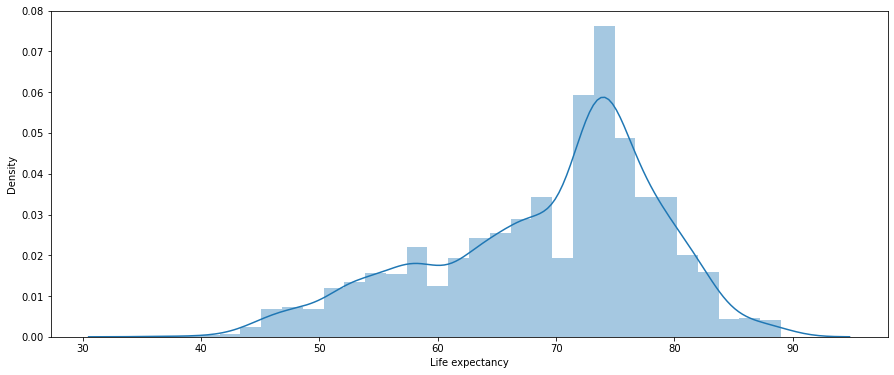

In [20]:
plt.figure(figsize=(15,6))
sns.distplot(df['Life expectancy']);

In [180]:
df['Life expectancy'].max()

89.0

In [181]:
df['Life expectancy'].min()

36.3

In [183]:
df['Life expectancy'].mean().round(2)

69.22

In [20]:
df['Life expectancy'].skew().round(2)

-0.64

In [21]:
df['Life expectancy'].kurtosis().round(2)

-0.23

In [25]:
round(df['Life expectancy'].var(),2)

90.7

In [175]:
round(df['Life expectancy'].std(),2)

9.52

In [28]:
cor_target=df.corrwith(df['Life expectancy'])
cor_target

Year                               0.170033
Life expectancy                    1.000000
Adult Mortality                   -0.696359
infant deaths                     -0.196557
Alcohol                            0.404877
percentage expenditure             0.381864
Hepatitis B                        0.256762
Measles                           -0.157586
BMI                                0.567694
under-five deaths                 -0.222529
Polio                              0.465556
Total expenditure                  0.218086
Diphtheria                         0.479495
HIV/AIDS                          -0.556556
GDP                                0.461455
Population                        -0.021538
thinness  1-19 years              -0.477183
thinness 5-9 years                -0.471584
Income composition of resources    0.724776
Schooling                          0.751975
dtype: float64

In [29]:
cor_target.sort_values(axis=0,ascending=False)

Life expectancy                    1.000000
Schooling                          0.751975
Income composition of resources    0.724776
BMI                                0.567694
Diphtheria                         0.479495
Polio                              0.465556
GDP                                0.461455
Alcohol                            0.404877
percentage expenditure             0.381864
Hepatitis B                        0.256762
Total expenditure                  0.218086
Year                               0.170033
Population                        -0.021538
Measles                           -0.157586
infant deaths                     -0.196557
under-five deaths                 -0.222529
thinness 5-9 years                -0.471584
thinness  1-19 years              -0.477183
HIV/AIDS                          -0.556556
Adult Mortality                   -0.696359
dtype: float64

# Categorical Variables

In [31]:
df.select_dtypes(include=['object', 'category']).columns.tolist()

['Country', 'Status']

In [29]:
df_cat=df.select_dtypes(include=['object','category'])
df_cat.count()

Country    2938
Status     2938
dtype: int64

In [26]:
# A quick glance over Categorical Variables

df.describe(include='O').T

,count,unique,top,freq
Country,2938,193,Afghanistan,16
Status,2938,2,Developing,2426


### Frequency of Unique Values in each Categorival Variable

In [34]:
df['Country'].value_counts()

Afghanistan              16
Peru                     16
Nicaragua                16
Niger                    16
Nigeria                  16
                         ..
Niue                      1
San Marino                1
Nauru                     1
Saint Kitts and Nevis     1
Dominica                  1
Name: Country, Length: 193, dtype: int64

In [35]:
df['Status'].value_counts()

Developing    2426
Developed      512
Name: Status, dtype: int64

In [36]:
# Frequency of unique values in each categorival variable in percentage form
(df['Country'].value_counts()/len(df)*100).round(2)

Afghanistan              0.54
Peru                     0.54
Nicaragua                0.54
Niger                    0.54
Nigeria                  0.54
                         ... 
Niue                     0.03
San Marino               0.03
Nauru                    0.03
Saint Kitts and Nevis    0.03
Dominica                 0.03
Name: Country, Length: 193, dtype: float64

In [37]:
(df['Status'].value_counts()/len(df)*100).round(2)

Developing    82.57
Developed     17.43
Name: Status, dtype: float64

### Mode of Categorical Values

In [36]:
df['Status'].mode()

0    Developing
Name: Status, dtype: object

In [34]:
cat_col=['Country','Status']
df[cat_col].mode()

,Country,Status
0,Afghanistan,Developing
1,Albania,NaN
2,Algeria,NaN
3,Angola,NaN
4,Antigua and Barbuda,NaN
...,...,...
178,Venezuela (Bolivarian Republic of),NaN
179,Viet Nam,NaN
180,Yemen,NaN
181,Zambia,NaN


### Visualization of Categorical Values

<IPython.core.display.Javascript object>

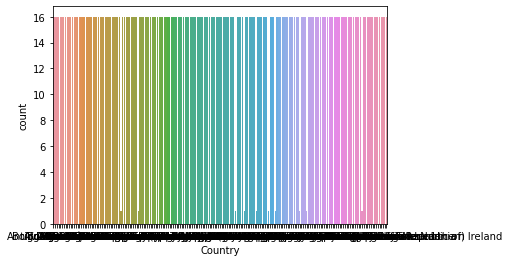

In [40]:
sns.countplot(x='Country',data=df);

<IPython.core.display.Javascript object>

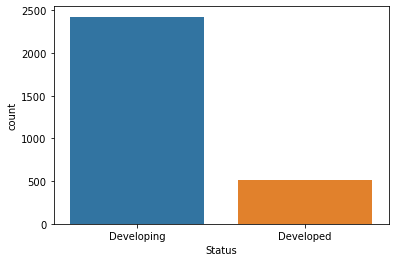

In [41]:
sns.countplot(x='Status',data=df);

###  Categorical Variables VS Target Variable (Bi-Variate Analysis)

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

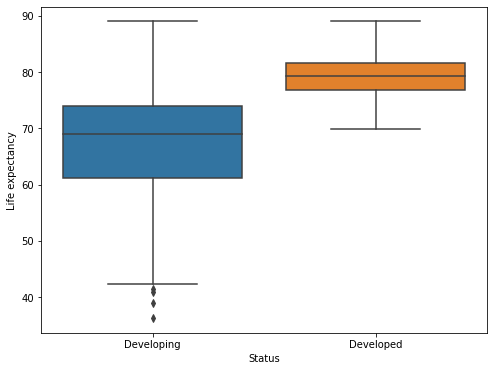

In [47]:
plt.figure(figsize=(8,6))
sns.boxplot(x='Status',y='Life expectancy',data=df,);

- Life expectancy is better in developed countries as compared to developing countries.

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

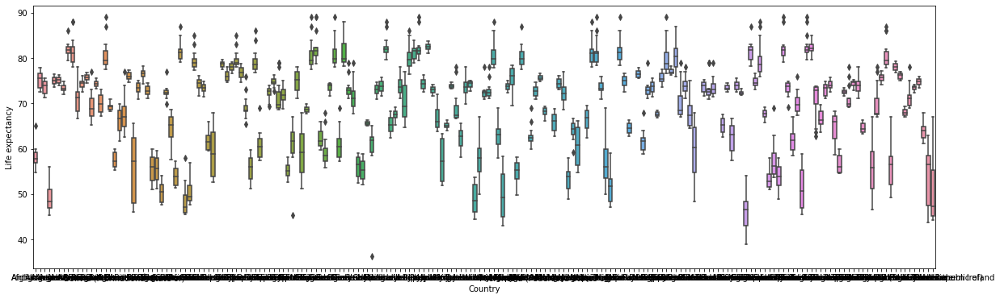

In [49]:
plt.figure(figsize=(20,6))
sns.boxplot(x='Country',y='Life expectancy',data=df,);

# Numerical Variables

In [214]:
df_num=df.select_dtypes(include='number')
df_num

,Year,Life expectancy,Adult Mortality,infant deaths,Alcohol,percentage expenditure,Hepatitis B,Measles,BMI,under-five deaths,Polio,Total expenditure,Diphtheria,HIV/AIDS,GDP,Population,thinness 1-19 years,thinness 5-9 years,Income composition of resources,Schooling
0,2015,65.0,263.0,62,0.01,71.279624,65.0,1154,19.1,83,6.0,8.16,65.0,0.1,584.259210,33736494.0,17.2,17.3,0.479,10.1
1,2014,59.9,271.0,64,0.01,73.523582,62.0,492,18.6,86,58.0,8.18,62.0,0.1,612.696514,327582.0,17.5,17.5,0.476,10.0
2,2013,59.9,268.0,66,0.01,73.219243,64.0,430,18.1,89,62.0,8.13,64.0,0.1,631.744976,31731688.0,17.7,17.7,0.470,9.9
3,2012,59.5,272.0,69,0.01,78.184215,67.0,2787,17.6,93,67.0,8.52,67.0,0.1,669.959000,3696958.0,17.9,18.0,0.463,9.8
4,2011,59.2,275.0,71,0.01,7.097109,68.0,3013,17.2,97,68.0,7.87,68.0,0.1,63.537231,2978599.0,18.2,18.2,0.454,9.5
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2933,2004,44.3,723.0,27,4.36,0.000000,68.0,31,27.1,42,67.0,7.13,65.0,33.6,454.366654,12777511.0,9.4,9.4,0.407,9.2
2934,2003,44.5,715.0,26,4.06,0.000000,7.0,998,26.7,41,7.0,6.52,68.0,36.7,453.351155,12633897.0,9.8,9.9,0.418,9.5
2935,2002,44.8,73.0,25,4.43,0.000000,73.0,304,26.3,40,73.0,6.53,71.0,39.8,57.348340,125525.0,1.2,1.3,0.427,10.0
2936,2001,45.3,686.0,25,1.72,0.000000,76.0,529,25.9,39,76.0,6.16,75.0,42.1,548.587312,12366165.0,1.6,1.7,0.427,9.8


In [262]:
df_num.count()

Year                               2938
Life expectancy                    2928
Adult Mortality                    2928
infant deaths                      2938
Alcohol                            2744
percentage expenditure             2938
Hepatitis B                        2385
Measles                            2938
BMI                                2904
under-five deaths                  2938
Polio                              2919
Total expenditure                  2712
Diphtheria                         2919
HIV/AIDS                           2938
GDP                                2490
Population                         2286
thinness  1-19 years               2904
thinness 5-9 years                 2904
Income composition of resources    2771
Schooling                          2775
dtype: int64

In [265]:
df_num.max()

Year                               2.015000e+03
Life expectancy                    8.900000e+01
Adult Mortality                    7.230000e+02
infant deaths                      1.800000e+03
Alcohol                            1.787000e+01
percentage expenditure             1.947991e+04
Hepatitis B                        9.900000e+01
Measles                            2.121830e+05
BMI                                8.730000e+01
under-five deaths                  2.500000e+03
Polio                              9.900000e+01
Total expenditure                  1.760000e+01
Diphtheria                         9.900000e+01
HIV/AIDS                           5.060000e+01
GDP                                1.191727e+05
Population                         1.293859e+09
thinness  1-19 years               2.770000e+01
thinness 5-9 years                 2.860000e+01
Income composition of resources    9.480000e-01
Schooling                          2.070000e+01
dtype: float64

In [266]:
df_num.min()

Year                               2000.00000
Life expectancy                      36.30000
Adult Mortality                       1.00000
infant deaths                         0.00000
Alcohol                               0.01000
percentage expenditure                0.00000
Hepatitis B                           1.00000
Measles                               0.00000
BMI                                   1.00000
under-five deaths                     0.00000
Polio                                 3.00000
Total expenditure                     0.37000
Diphtheria                            2.00000
HIV/AIDS                              0.10000
GDP                                   1.68135
Population                           34.00000
thinness  1-19 years                  0.10000
thinness 5-9 years                    0.10000
Income composition of resources       0.00000
Schooling                             0.00000
dtype: float64

In [267]:
df_num.mean()

Year                               2.007519e+03
Life expectancy                    6.922493e+01
Adult Mortality                    1.647964e+02
infant deaths                      3.030395e+01
Alcohol                            4.602861e+00
percentage expenditure             7.382513e+02
Hepatitis B                        8.094046e+01
Measles                            2.419592e+03
BMI                                3.832125e+01
under-five deaths                  4.203574e+01
Polio                              8.255019e+01
Total expenditure                  5.938190e+00
Diphtheria                         8.232408e+01
HIV/AIDS                           1.742103e+00
GDP                                7.483158e+03
Population                         1.275338e+07
thinness  1-19 years               4.839704e+00
thinness 5-9 years                 4.870317e+00
Income composition of resources    6.275511e-01
Schooling                          1.199279e+01
dtype: float64

### Descriptive Statistics

In [51]:
# Basic statistical summary of numerical variables

df_num.describe().T.round(2)

,count,mean,std,min,25%,50%,75%,max
Year,2938.0,2007.52,4.61,2000.00,2004.00,2008.00,2012.00,2.015000e+03
Life expectancy,2928.0,69.22,9.52,36.30,63.10,72.10,75.70,8.900000e+01
Adult Mortality,2928.0,164.80,124.29,1.00,74.00,144.00,228.00,7.230000e+02
infant deaths,2938.0,30.30,117.93,0.00,0.00,3.00,22.00,1.800000e+03
Alcohol,2744.0,4.60,4.05,0.01,0.88,3.76,7.70,1.787000e+01
percentage expenditure,2938.0,738.25,1987.91,0.00,4.69,64.91,441.53,1.947991e+04
Hepatitis B,2385.0,80.94,25.07,1.00,77.00,92.00,97.00,9.900000e+01
Measles,2938.0,2419.59,11467.27,0.00,0.00,17.00,360.25,2.121830e+05
BMI,2904.0,38.32,20.04,1.00,19.30,43.50,56.20,8.730000e+01
under-five deaths,2938.0,42.04,160.45,0.00,0.00,4.00,28.00,2.500000e+03


# Distribution, Skewness and Kurtosis

In [185]:
def rand_color():
    c = "#"+"".join(map(hex,random.choices(range(256), k=3))).replace("0x","")
    if len(c) != 7:
        return rand_color()
    return c

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

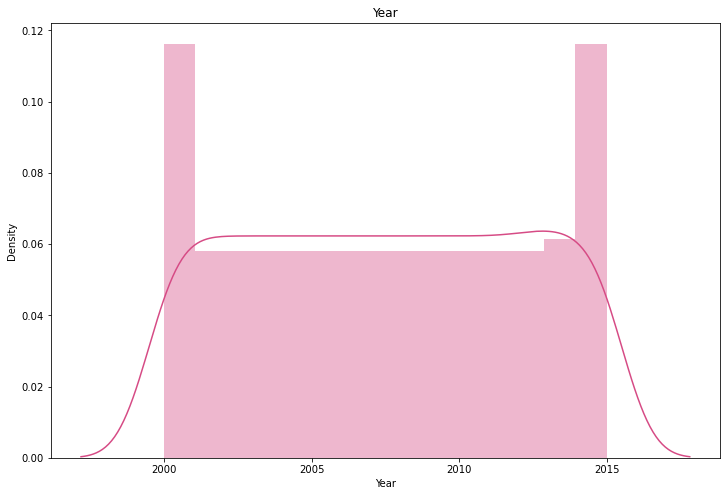

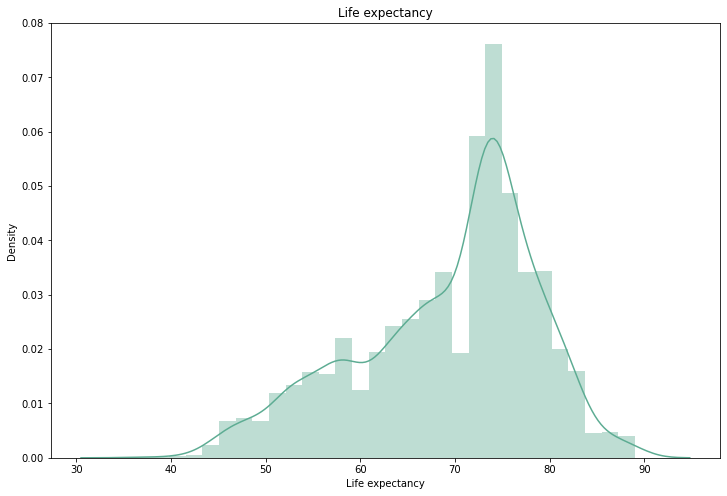

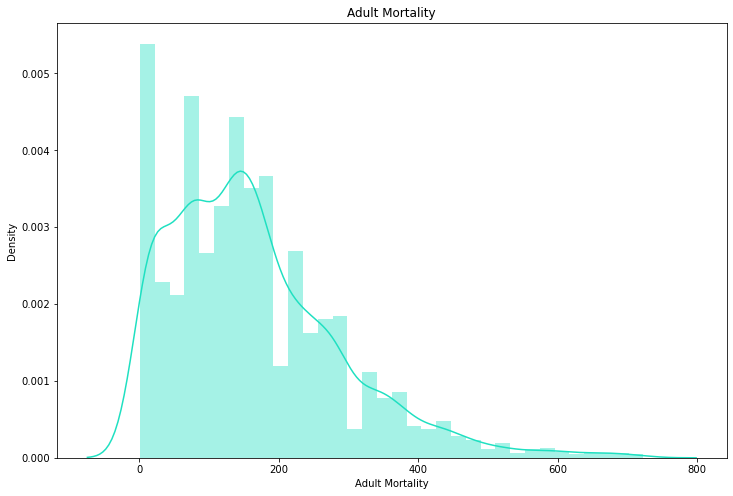

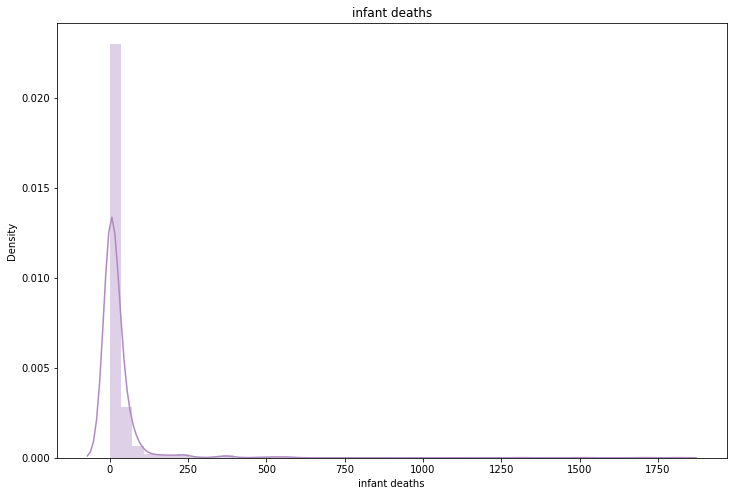

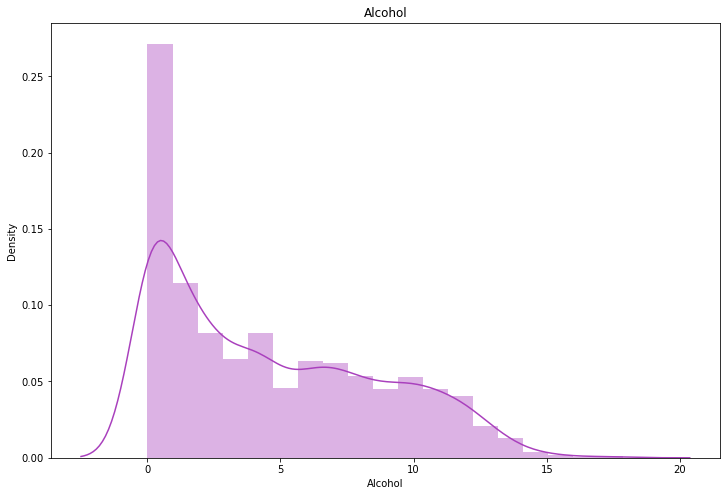

...

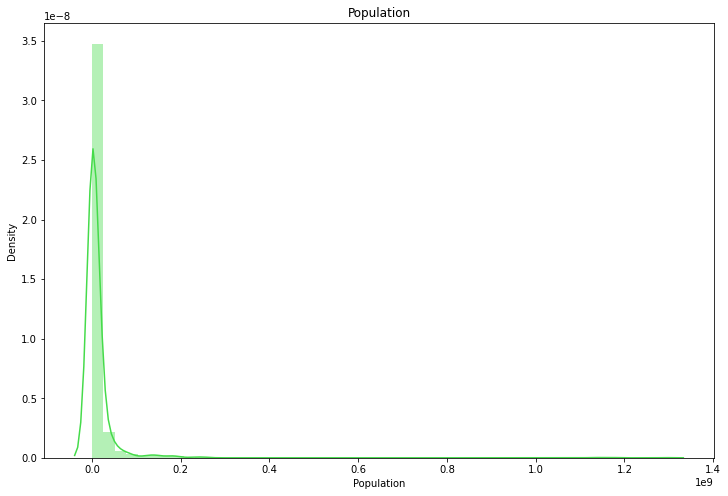

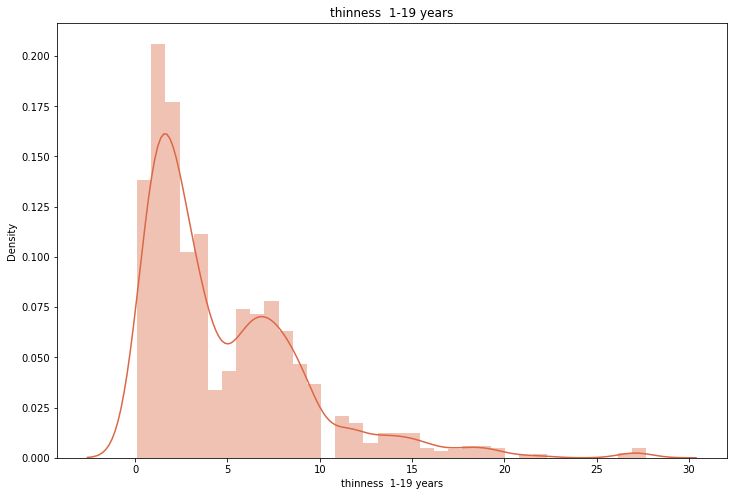

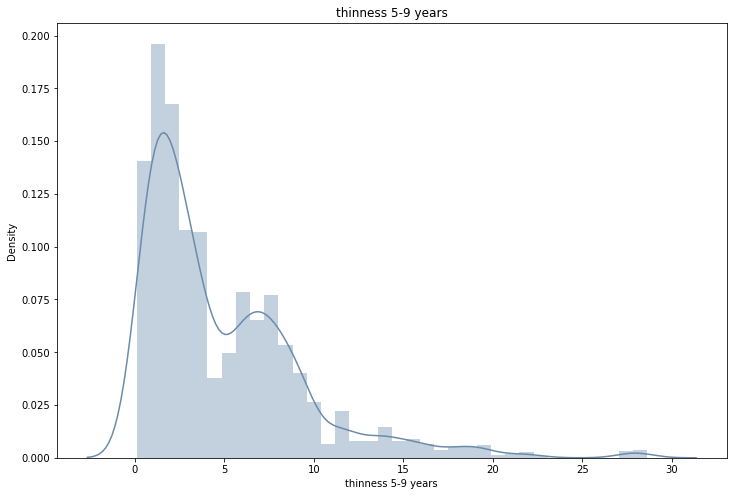

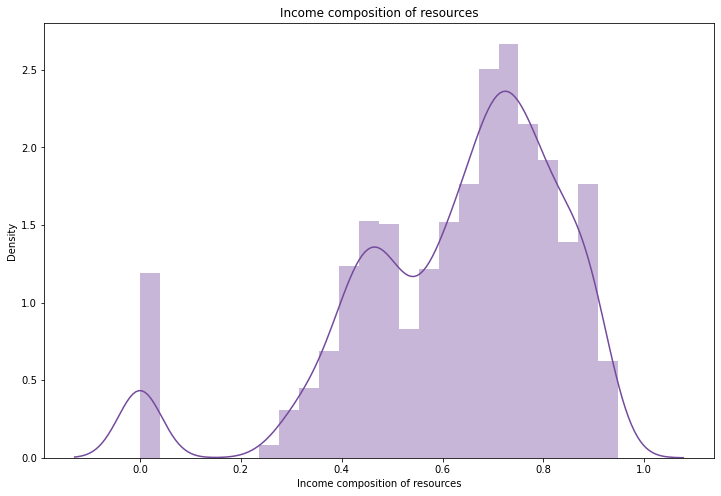

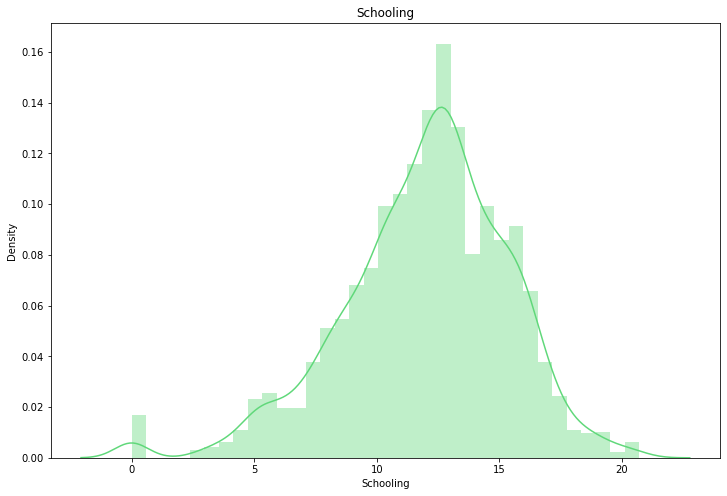

In [186]:
for i in df_num:
    print("\n")
    plt.figure(figsize=(12,8))
    sns.distplot(df[i], color = rand_color()).set(title = i)

In [187]:
df.skew()

Year                               -0.006409
Life expectancy                    -0.638605
Adult Mortality                     1.174369
infant deaths                       9.786963
Alcohol                             0.589563
percentage expenditure              4.652051
Hepatitis B                        -1.930845
Measles                             9.441332
BMI                                -0.219312
under-five deaths                   9.495065
Polio                              -2.098053
Total expenditure                   0.618686
Diphtheria                         -2.072753
HIV/AIDS                            5.396112
GDP                                 3.206655
Population                         15.916236
thinness  1-19 years                1.711471
thinness 5-9 years                  1.777424
Income composition of resources    -1.143763
Schooling                          -0.602437
dtype: float64

In [188]:
df.kurtosis()

Year                                -1.213722
Life expectancy                     -0.234477
Adult Mortality                      1.748860
infant deaths                      116.042756
Alcohol                             -0.802909
percentage expenditure              26.573387
Hepatitis B                          2.770259
Measles                            114.859903
BMI                                 -1.291095
under-five deaths                  109.752795
Polio                                3.776510
Total expenditure                    1.156270
Diphtheria                           3.558143
HIV/AIDS                            34.892008
GDP                                 12.333074
Population                         298.010267
thinness  1-19 years                 3.970439
thinness 5-9 years                   4.358730
Income composition of resources      1.392814
Schooling                            0.886151
dtype: float64

# Variance/ Standard Deviation

In [189]:
df.var()

Year                               2.128753e+01
Life expectancy                    9.070405e+01
Adult Mortality                    1.544852e+04
infant deaths                      1.390666e+04
Alcohol                            1.642205e+01
percentage expenditure             3.951805e+06
Hepatitis B                        6.285057e+02
Measles                            1.314983e+08
BMI                                4.017633e+02
under-five deaths                  2.574277e+04
Polio                              5.488733e+02
Total expenditure                  6.241601e+00
Diphtheria                         5.624919e+02
HIV/AIDS                           2.578390e+01
GDP                                2.036377e+08
Population                         3.722476e+15
thinness  1-19 years               1.953812e+01
thinness 5-9 years                 2.033002e+01
Income composition of resources    4.448031e-02
Schooling                          1.128234e+01
dtype: float64

In [190]:
df.std()

Year                               4.613841e+00
Life expectancy                    9.523867e+00
Adult Mortality                    1.242921e+02
infant deaths                      1.179265e+02
Alcohol                            4.052413e+00
percentage expenditure             1.987915e+03
Hepatitis B                        2.507002e+01
Measles                            1.146727e+04
BMI                                2.004403e+01
under-five deaths                  1.604455e+02
Polio                              2.342805e+01
Total expenditure                  2.498320e+00
Diphtheria                         2.371691e+01
HIV/AIDS                           5.077785e+00
GDP                                1.427017e+04
Population                         6.101210e+07
thinness  1-19 years               4.420195e+00
thinness 5-9 years                 4.508882e+00
Income composition of resources    2.109036e-01
Schooling                          3.358920e+00
dtype: float64

In [191]:
quasi_constant_selector=VarianceThreshold(threshold=0)
quasi_constant_selector.fit(df_num)

VarianceThreshold(threshold=0)

In [192]:
quasi_constant_selector.get_support()

array([ True,  True,  True,  True,  True,  True,  True,  True,  True,
        True,  True,  True,  True,  True,  True,  True,  True,  True,
        True,  True])

- True means no-constant features

- False means constant features

-  of 20 , none is constant feature

In [193]:
sum(quasi_constant_selector.get_support())

20

In [194]:
# Let's find quasi constant features which is none from dataset
quasi_constant_columns=[column for column in df_num.columns
                       if column not in df_num.columns[quasi_constant_selector.get_support()]]
print(len(quasi_constant_columns))

0


# Bi-Variate Analysis
### 1. Categorical-Categorical
### 2. Numerical-Numerical
### 3. Numerical-Categorical

### 1. Categorical-Categorical

- As there are 193 countries, so it is not feasible to show them

In [126]:
df_cat

,Country,Status
0,Afghanistan,Developing
1,Afghanistan,Developing
2,Afghanistan,Developing
3,Afghanistan,Developing
4,Afghanistan,Developing
...,...,...
2933,Zimbabwe,Developing
2934,Zimbabwe,Developing
2935,Zimbabwe,Developing
2936,Zimbabwe,Developing


In [134]:
df[df['Status']=='Developed']['Country']

112                    Australia
113                    Australia
114                    Australia
115                    Australia
116                    Australia
                  ...           
2805    United States of America
2806    United States of America
2807    United States of America
2808    United States of America
2809    United States of America
Name: Country, Length: 512, dtype: object

In [130]:
df[df['Status']=='Developing']['Country']

0       Afghanistan
1       Afghanistan
2       Afghanistan
3       Afghanistan
4       Afghanistan
           ...     
2933       Zimbabwe
2934       Zimbabwe
2935       Zimbabwe
2936       Zimbabwe
2937       Zimbabwe
Name: Country, Length: 2426, dtype: object

In [131]:
df[df['Status']=='Developed']['Country'].count()

512

In [132]:
df[df['Status']=='Developing']['Country'].count()

2426

### 2. Numerical-Numerical

In [58]:
corr_matrix=df.corr()
corr_matrix

,Year,Life expectancy,Adult Mortality,infant deaths,Alcohol,percentage expenditure,Hepatitis B,Measles,BMI,under-five deaths,Polio,Total expenditure,Diphtheria,HIV/AIDS,GDP,Population,thinness 1-19 years,thinness 5-9 years,Income composition of resources,Schooling
Year,1.000000,0.170033,-0.079052,-0.037415,-0.052990,0.031400,0.104333,-0.082493,0.108974,-0.042937,0.094158,0.090740,0.134337,-0.139741,0.101620,0.016969,-0.047876,-0.050929,0.243468,0.209400
Life expectancy,0.170033,1.000000,-0.696359,-0.196557,0.404877,0.381864,0.256762,-0.157586,0.567694,-0.222529,0.465556,0.218086,0.479495,-0.556556,0.461455,-0.021538,-0.477183,-0.471584,0.724776,0.751975
Adult Mortality,-0.079052,-0.696359,1.000000,0.078756,-0.195848,-0.242860,-0.162476,0.031176,-0.387017,0.094146,-0.274823,-0.115281,-0.275131,0.523821,-0.296049,-0.013647,0.302904,0.308457,-0.457626,-0.454612
infant deaths,-0.037415,-0.196557,0.078756,1.000000,-0.115638,-0.085612,-0.223566,0.501128,-0.227279,0.996629,-0.170689,-0.128616,-0.175171,0.025231,-0.108427,0.556801,0.465711,0.471350,-0.145139,-0.193720
Alcohol,-0.052990,0.404877,-0.195848,-0.115638,1.000000,0.341285,0.087549,-0.051827,0.330408,-0.112370,0.221734,0.296942,0.222020,-0.048845,0.354712,-0.035252,-0.428795,-0.417414,0.450040,0.547378
percentage expenditure,0.031400,0.381864,-0.242860,-0.085612,0.341285,1.000000,0.016274,-0.056596,0.228700,-0.087852,0.147259,0.174420,0.143624,-0.097857,0.899373,-0.025662,-0.251369,-0.252905,0.381952,0.389687
Hepatitis B,0.104333,0.256762,-0.162476,-0.223566,0.087549,0.016274,1.000000,-0.120529,0.150380,-0.233126,0.486171,0.058280,0.611495,-0.112675,0.083903,-0.123321,-0.120429,-0.124960,0.199549,0.231117
Measles,-0.082493,-0.157586,0.031176,0.501128,-0.051827,-0.056596,-0.120529,1.000000,-0.175977,0.507809,-0.136166,-0.106241,-0.141882,0.030899,-0.076466,0.265966,0.224808,0.221072,-0.129568,-0.137225
BMI,0.108974,0.567694,-0.387017,-0.227279,0.330408,0.228700,0.150380,-0.175977,1.000000,-0.237669,0.284569,0.242503,0.283147,-0.243717,0.301557,-0.072301,-0.532025,-0.538911,0.508774,0.546961
under-five deaths,-0.042937,-0.222529,0.094146,0.996629,-0.112370,-0.087852,-0.233126,0.507809,-0.237669,1.000000,-0.188720,-0.130148,-0.195668,0.038062,-0.112081,0.544423,0.467789,0.472263,-0.163305,-0.209373


In [50]:
df.corrwith(df['Life expectancy'])

Year                               0.170033
Life expectancy                    1.000000
Adult Mortality                   -0.696359
infant deaths                     -0.196557
Alcohol                            0.404877
percentage expenditure             0.381864
Hepatitis B                        0.256762
Measles                           -0.157586
BMI                                0.567694
under-five deaths                 -0.222529
Polio                              0.465556
Total expenditure                  0.218086
Diphtheria                         0.479495
HIV/AIDS                          -0.556556
GDP                                0.461455
Population                        -0.021538
thinness  1-19 years              -0.477183
thinness 5-9 years                -0.471584
Income composition of resources    0.724776
Schooling                          0.751975
dtype: float64

- There is significant impact of Alcohol, BMI, Polio, Diphtheria, GDP, Income composition of resources and Schooling on Life Expectancy.

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

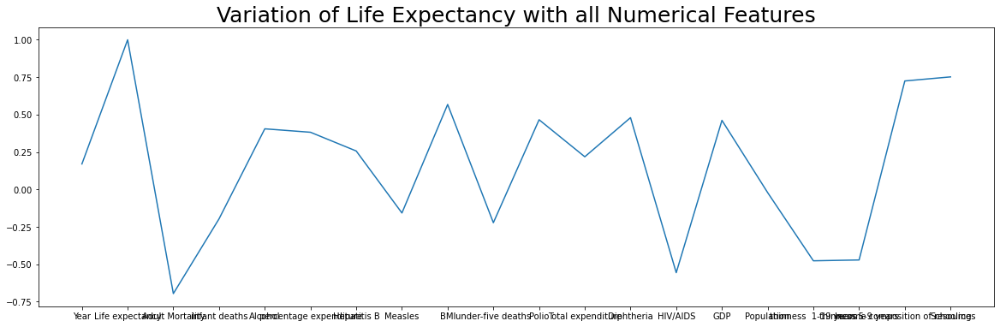

In [179]:
plt.figure(figsize=(20,6))
plt.plot(df.corrwith(df['Life expectancy']))
plt.title('Variation of Life Expectancy with all Numerical Features',fontsize=25);

In [51]:
# Let's find highly correlated features

def correlation (dataset,threshold):
    col_corr=set()
    corr_matrix=dataset.corr()
    for i in range (len(corr_matrix.columns)):
        for j in range(i):
            if abs(corr_matrix.iloc[i,j])>threshold:
                colname=corr_matrix.columns[i]
                col_corr.add(colname)
    return col_corr

In [52]:
corr_features=correlation(df,0.8)
corr_features

{'GDP', 'Schooling', 'thinness 5-9 years', 'under-five deaths'}

In [31]:
len(corr_features)

4

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

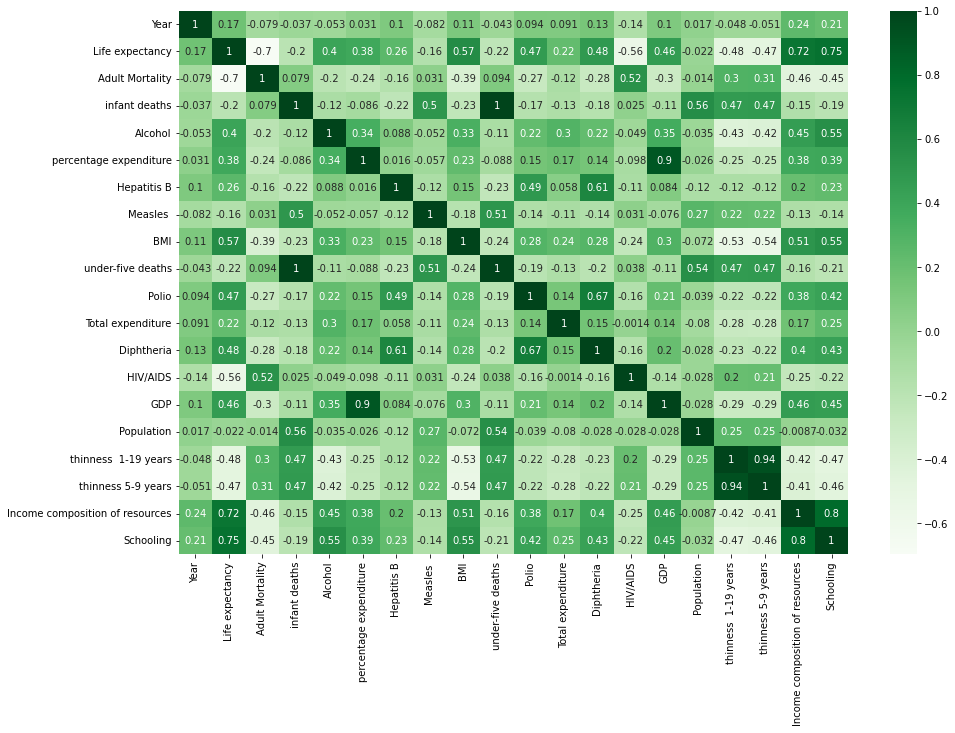

In [62]:
# Correlation Heatmap

plt.figure(figsize=(15,10))
sns.heatmap(df.corr(),annot=True,cmap='Greens');

### Observations

- It is observed that very strong correlation[>= 0.8] between:
- "infant.deaths" and "under.five.deaths".
- "GDP" and "percentage expenditure".
- "thinness 1-19 years" and "thinness 5-9 years".
- "Schooling" and "Income Composition of resources"

### Visualization of Target Variable with other Numerical Variables

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

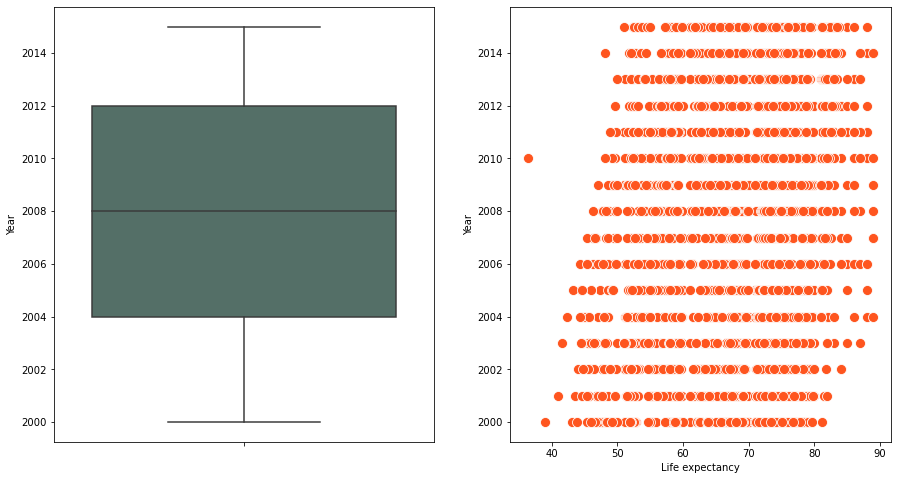

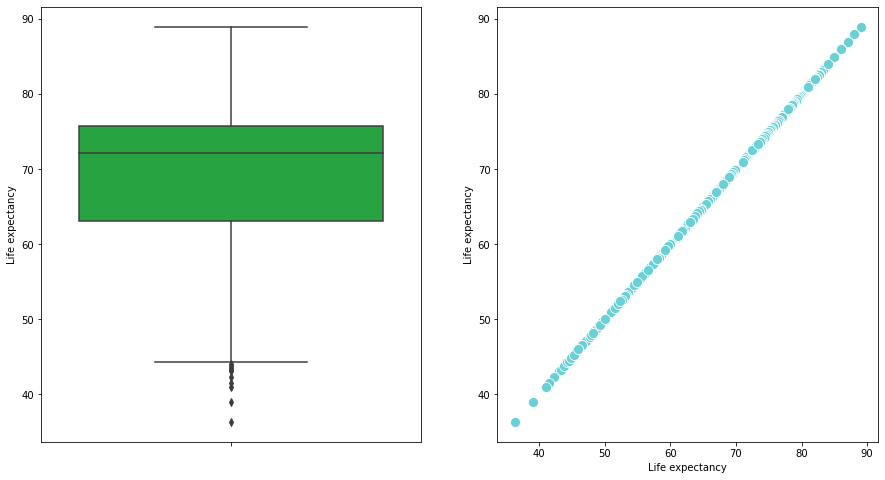

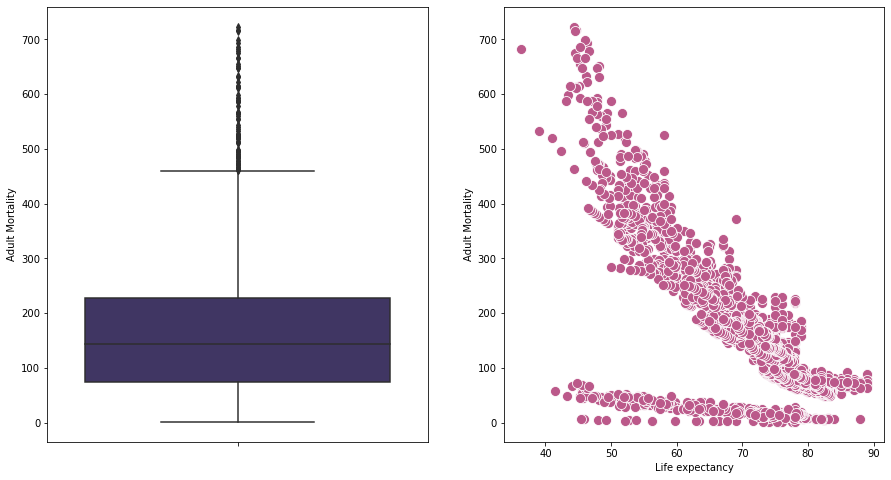

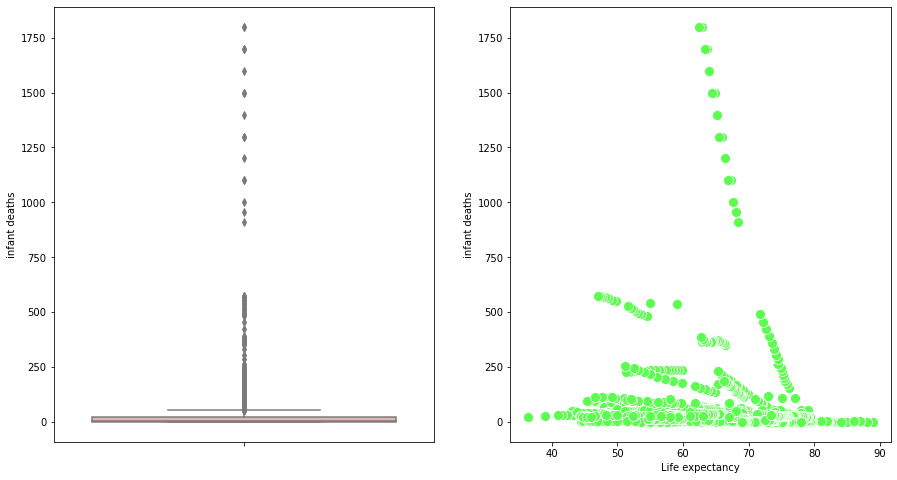

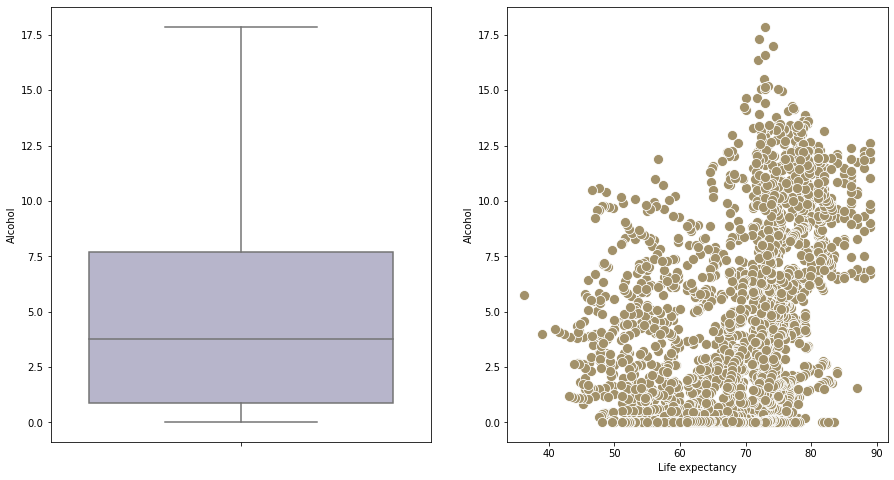

...

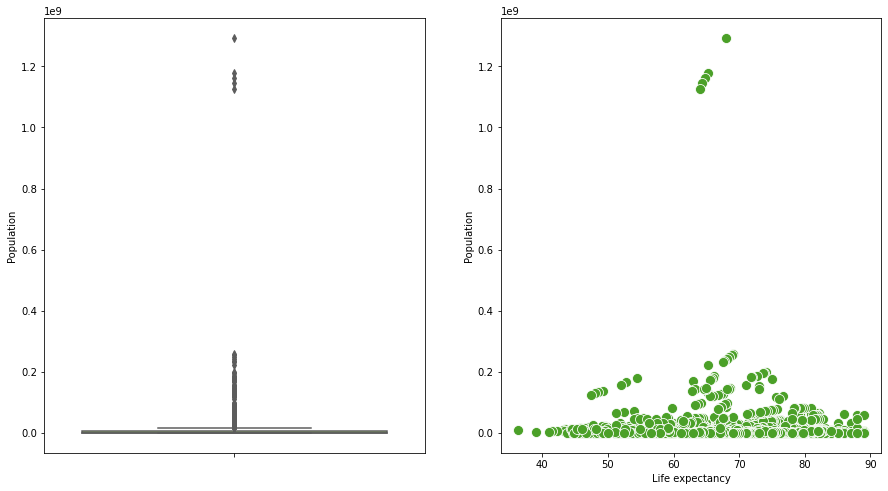

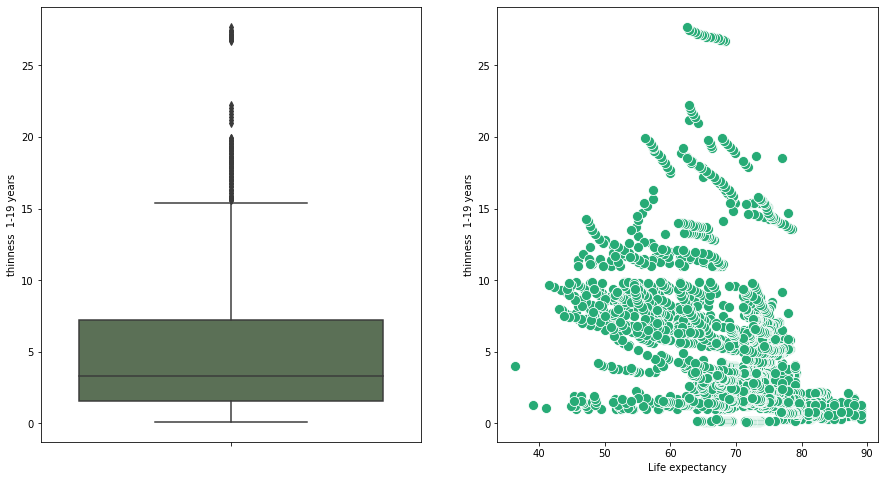

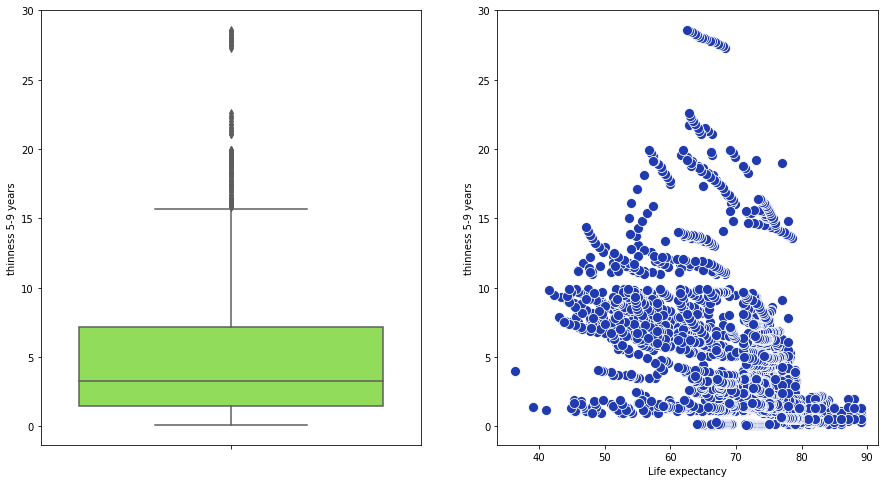

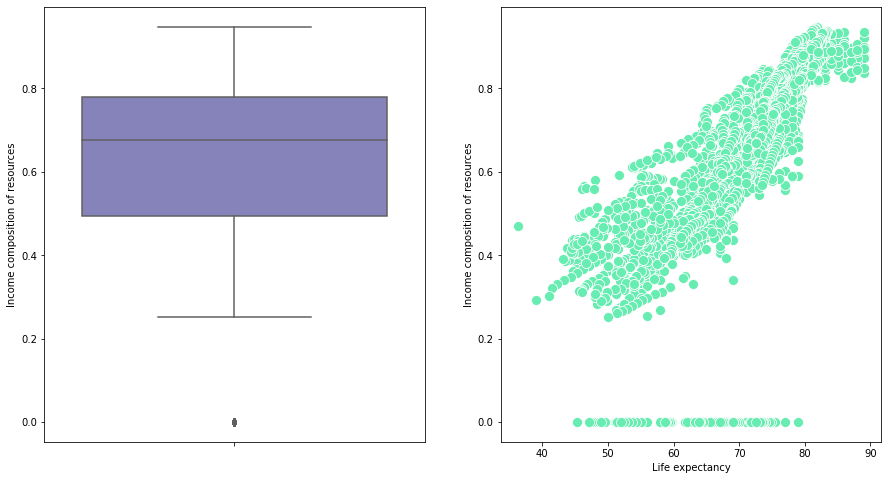

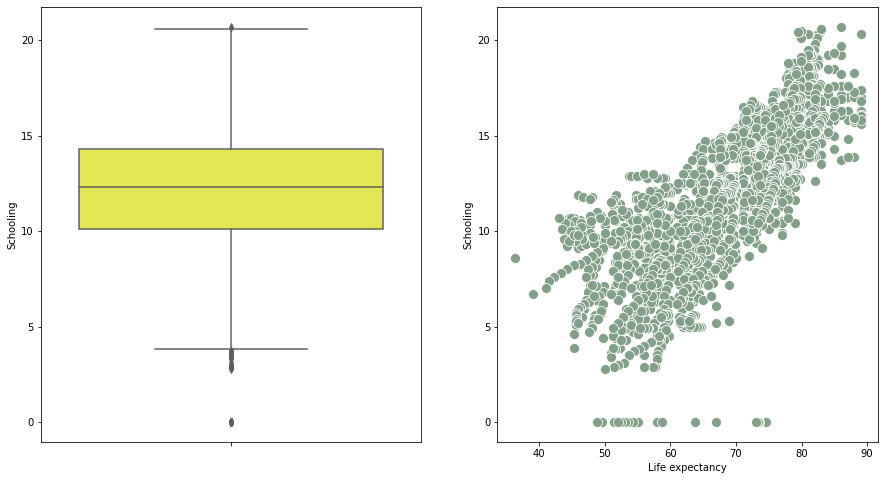

In [26]:
for col in df_num:
    print("\n")
    fig, ax =plt.subplots(1,2, figsize=(15,8))
    sns.boxplot(data=df, y=col, ax=ax[0], color=rand_color())
    sns.scatterplot(data=df,x = 'Life expectancy', s = 100, y=col, ax=ax[1], color = rand_color())

### 3. Numerical-Categorical

In [63]:
df_cat

Country    2938
Status     2938
dtype: int64

In [217]:
df_num.count()

Year                               2938
Life expectancy                    2928
Adult Mortality                    2928
infant deaths                      2938
Alcohol                            2744
percentage expenditure             2938
Hepatitis B                        2385
Measles                            2938
BMI                                2904
under-five deaths                  2938
Polio                              2919
Total expenditure                  2712
Diphtheria                         2919
HIV/AIDS                           2938
GDP                                2490
Population                         2286
thinness  1-19 years               2904
thinness 5-9 years                 2904
Income composition of resources    2771
Schooling                          2775
dtype: int64

### Visualization

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

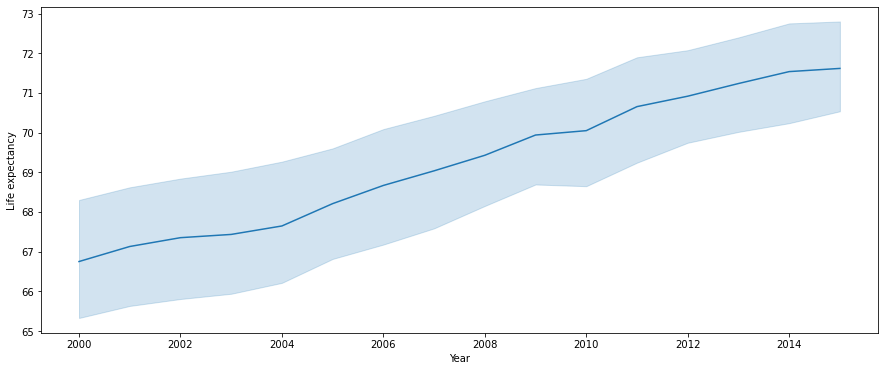

In [264]:
plt.figure(figsize=(15,6))
sns.lineplot(data=df,x = 'Year', y='Life expectancy');

- Life expectancy rate is increasing with the passahe of time.

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

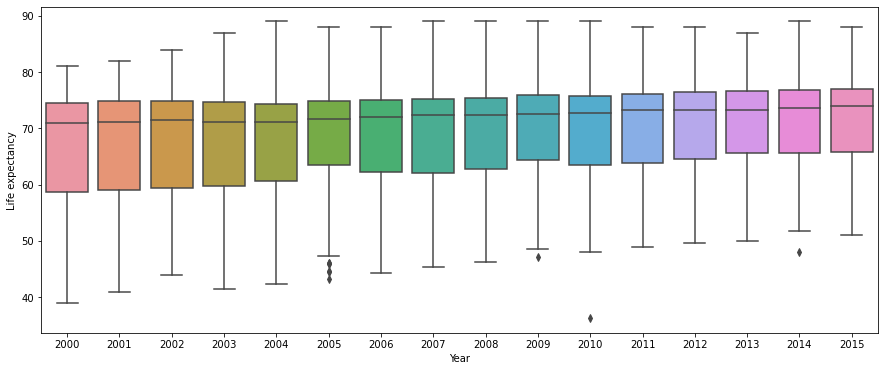

In [83]:
plt.figure(figsize=(15,6))
sns.boxplot(data=df, x='Year', y='Life expectancy');

<IPython.core.display.Javascript object>

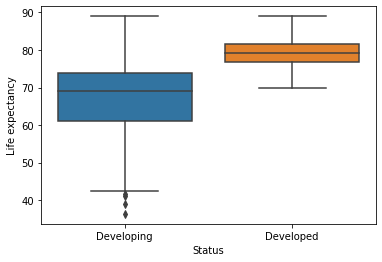

In [4]:
sns.boxplot(x=df['Status'],y=df['Life expectancy']);

- it is observed that life expectancy in Developed countries is higher which means the categorical variable might be a good predictor for the model.

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

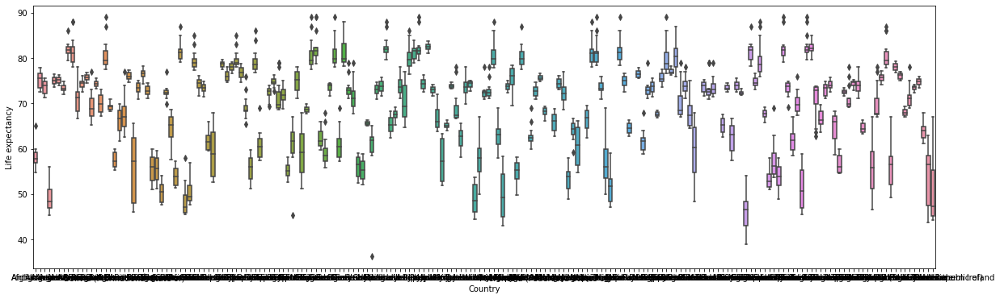

In [6]:
plt.figure(figsize=(20,6))
sns.boxplot(x=df['Country'],y=df['Life expectancy']);

<IPython.core.display.Javascript object>

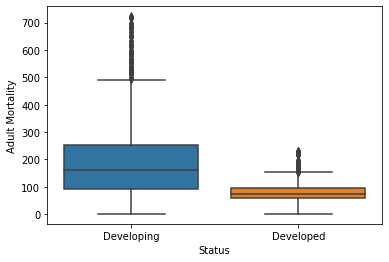

In [7]:
sns.boxplot(x=df['Status'],y=df['Adult Mortality']);

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

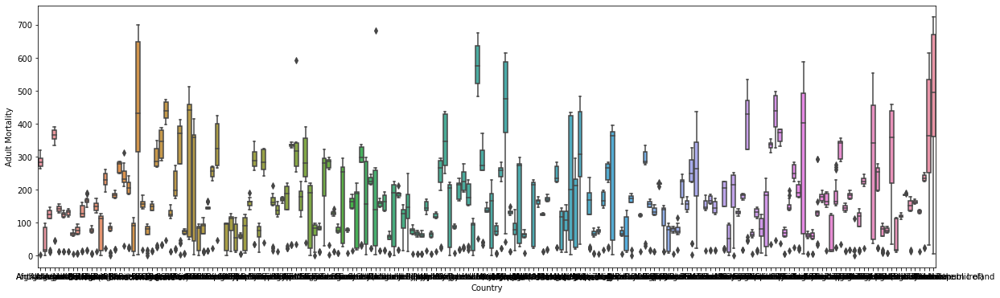

In [8]:
plt.figure(figsize=(20,6))
sns.boxplot(x=df['Country'],y=df['Adult Mortality']);

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

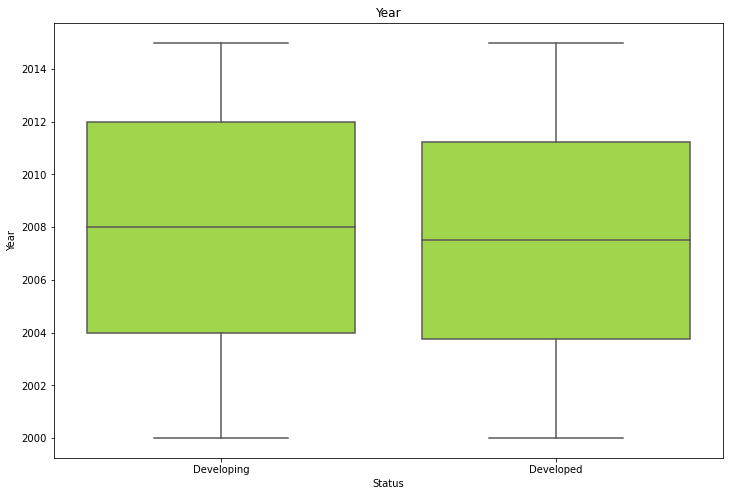

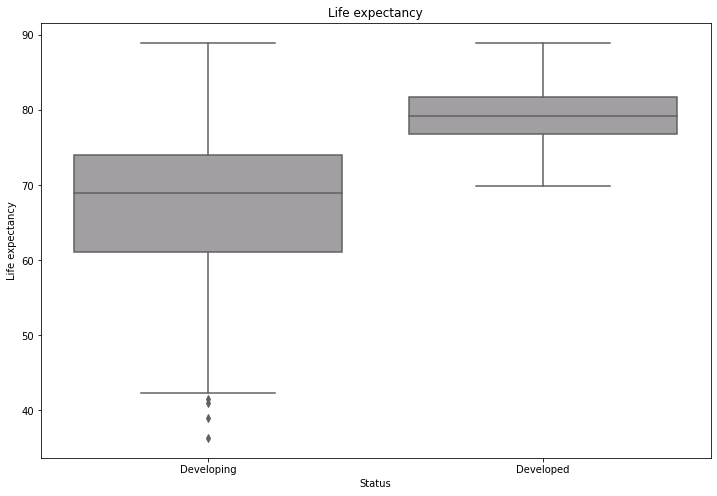

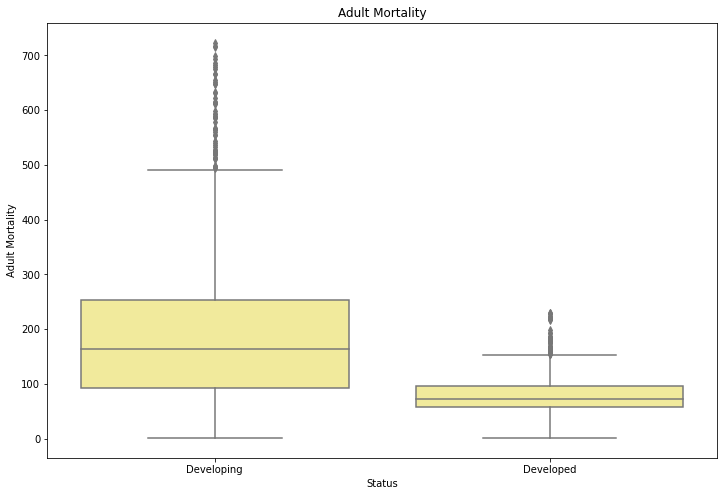

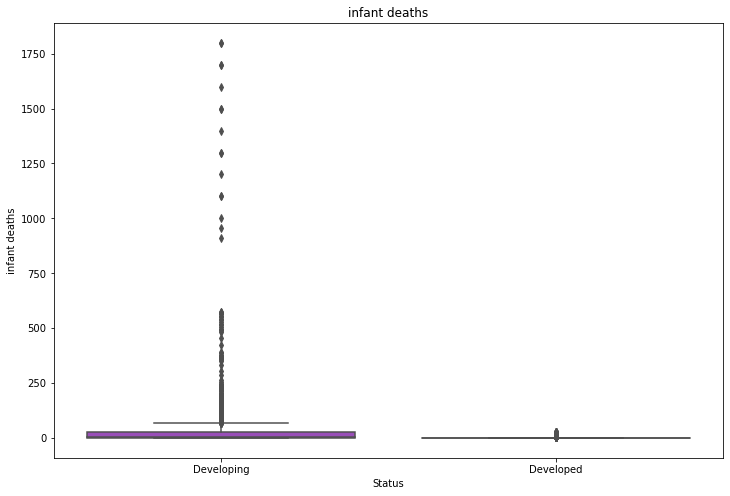

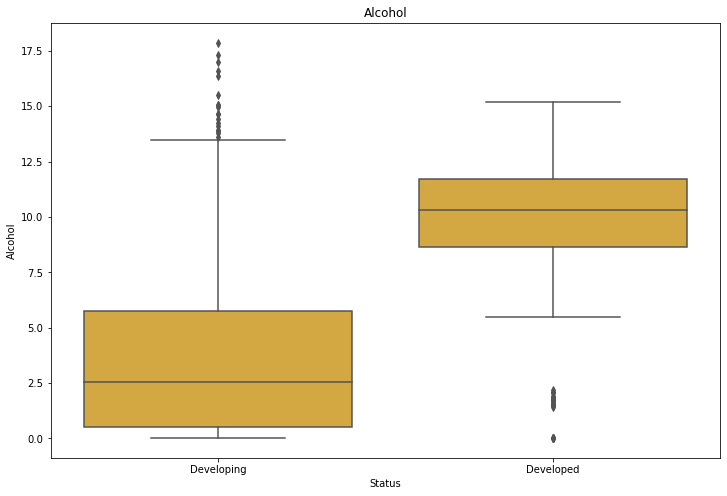

...

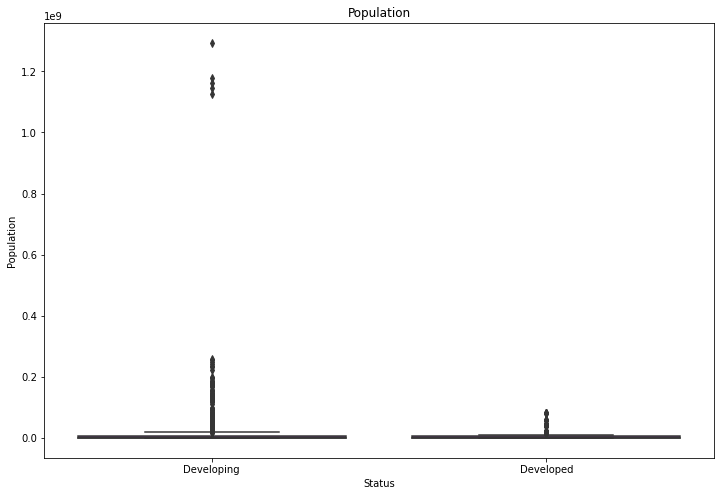

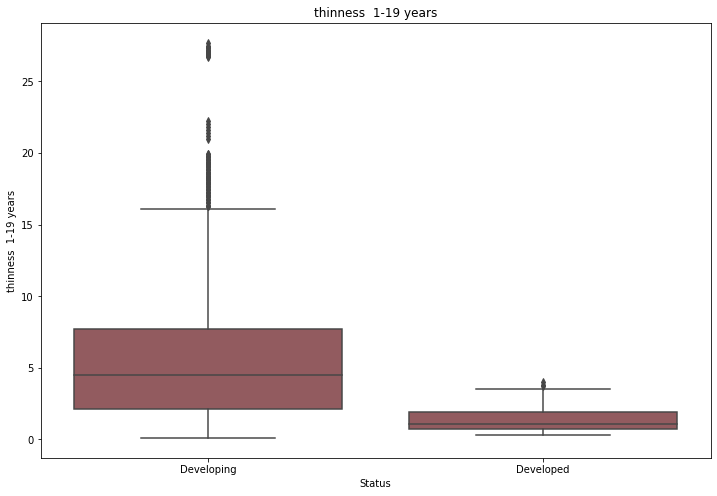

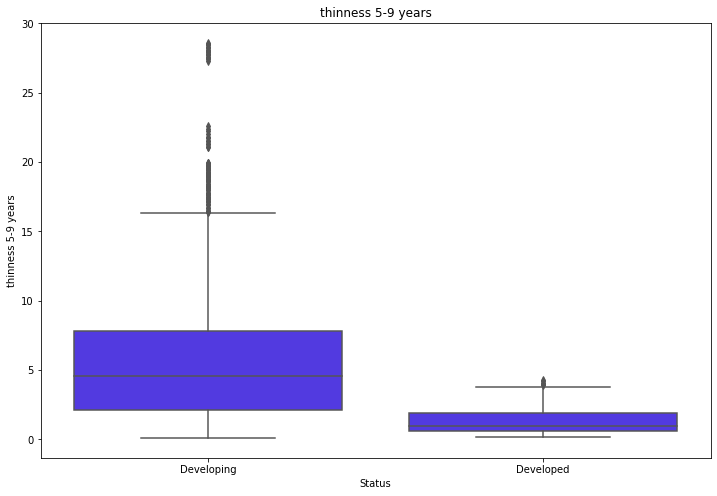

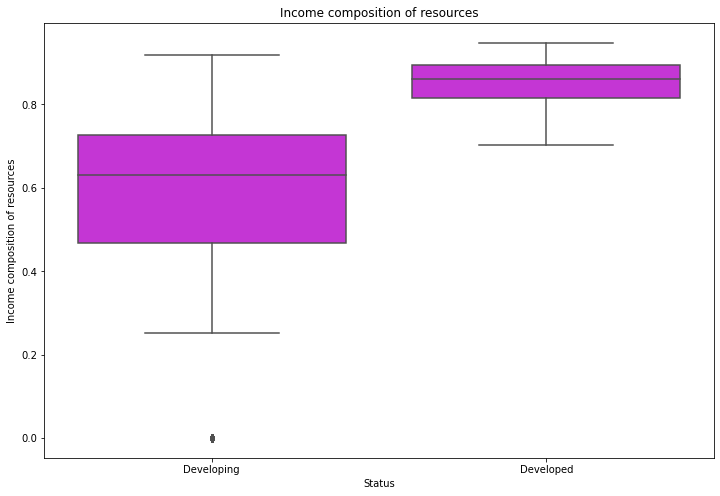

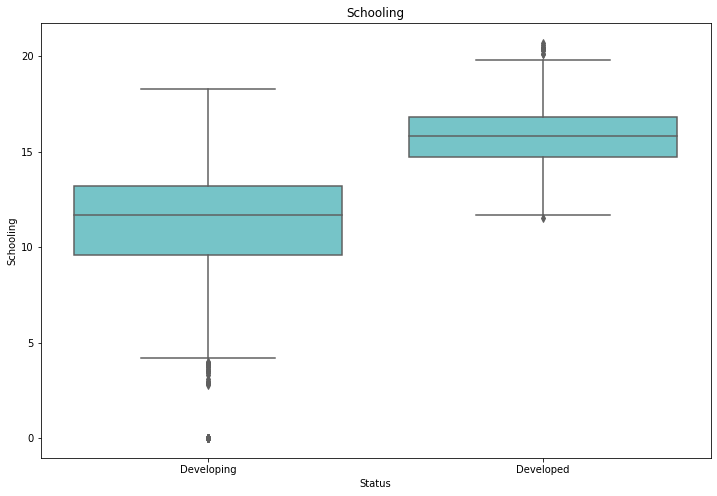

In [128]:
for i in df_num:
    print("\n")
    plt.figure(figsize=(12,8))
    sns.boxplot(x=df['Status'],y=df[i], color = rand_color()).set(title = i);

In [244]:
categories=list(df['Status'].unique())

for category in categories:
    means=round(df[df['Status']==category]['Year'].mean()*100,0)
    print(category,'--->',means)

Developing ---> 200752.0
Developed ---> 200750.0


- Non Significant impact.

In [115]:
df[['Country','Status']]

,Country,Status
0,Afghanistan,Developing
1,Afghanistan,Developing
2,Afghanistan,Developing
3,Afghanistan,Developing
4,Afghanistan,Developing
...,...,...
2933,Zimbabwe,Developing
2934,Zimbabwe,Developing
2935,Zimbabwe,Developing
2936,Zimbabwe,Developing


In [245]:
categories=list(df['Status'].unique())

for category in categories:
    means=round(df[df['Status']==category]['Adult Mortality'].mean()*100,0)
    print(category,'--->',means)

Developing ---> 18283.0
Developed ---> 7969.0


- The rate of Adult Mortality is more in developing countries as compared to developed countries.

In [246]:
categories=list(df['Status'].unique())

for category in categories:
    means=round(df[df['Status']==category]['infant deaths'].mean()*100,0)
    print(category,'--->',means)

Developing ---> 3638.0
Developed ---> 149.0


In [247]:
categories=list(df['Status'].unique())

for category in categories:
    means=round(df[df['Status']==category]['Alcohol'].mean()*100,0)
    print(category,'--->',means)

Developing ---> 348.0
Developed ---> 983.0


In [93]:
categories=list(df['Status'].unique())
levels

for category in categories:
    means=round(df[df['Status']==category]['percentage expenditure'].mean()*100,0)
    print(category,'--->',means)

Developing ---> 32347.0
Developed ---> 270360.0


In [248]:
categories=list(df['Status'].unique())

for category in categories:
    means=round(df[df['Status']==category]['Hepatitis B'].mean()*100,0)
    print(category,'--->',means)

Developing ---> 7976.0
Developed ---> 8804.0


In [249]:
categories=list(df['Status'].unique())

for category in categories:
    means=round(df[df['Status']==category]['Measles'].mean()*100,0)
    print(category,'--->',means)

Developing ---> 282493.0
Developed ---> 49901.0


In [250]:
categories=list(df['Status'].unique())

for category in categories:
    means=round(df[df['Status']==category]['BMI'].mean()*100,0)
    print(category,'--->',means)

Developing ---> 3544.0
Developed ---> 5180.0


In [251]:
categories=list(df['Status'].unique())

for category in categories:
    means=round(df[df['Status']==category]['under-five deaths'].mean()*100,0)
    print(category,'--->',means)

Developing ---> 5053.0
Developed ---> 181.0


In [252]:
categories=list(df['Status'].unique())

for category in categories:
    means=round(df[df['Status']==category]['Polio'].mean()*100,0)
    print(category,'--->',means)

Developing ---> 8017.0
Developed ---> 9374.0


In [253]:
categories=list(df['Status'].unique())

for category in categories:
    means=round(df[df['Status']==category]['Total expenditure'].mean()*100,0)
    print(category,'--->',means)

Developing ---> 559.0
Developed ---> 755.0


In [254]:
categories=list(df['Status'].unique())

for category in categories:
    means=round(df[df['Status']==category]['Diphtheria'].mean()*100,0)
    print(category,'--->',means)

Developing ---> 7995.0
Developed ---> 9348.0


In [255]:
categories=list(df['Status'].unique())

for category in categories:
    means=round(df[df['Status']==category]['HIV/AIDS'].mean()*100,0)
    print(category,'--->',means)

Developing ---> 209.0
Developed ---> 10.0


In [256]:
categories=list(df['Status'].unique())

for category in categories:
    means=round(df[df['Status']==category]['GDP'].mean()*100,0)
    print(category,'--->',means)

Developing ---> 428656.0
Developed ---> 2205339.0


In [257]:
categories=list(df['Status'].unique())

for category in categories:
    means=round(df[df['Status']==category]['Population'].mean()*100,0)
    print(category,'--->',means)

Developing ---> 1407107676.0
Developed ---> 683005283.0


In [258]:
categories=list(df['Status'].unique())

for category in categories:
    means=round(df[df['Status']==category]['thinness 5-9 years'].mean()*100,0)
    print(category,'--->',means)

Developing ---> 564.0
Developed ---> 130.0


In [259]:
categories=list(df['Status'].unique())

for category in categories:
    means=round(df[df['Status']==category]['Income composition of resources'].mean()*100,0)
    print(category,'--->',means)

Developing ---> 58.0
Developed ---> 85.0


In [260]:
categories=list(df['Status'].unique())

for category in categories:
    means=round(df[df['Status']==category]['Schooling'].mean()*100,0)
    print(category,'--->',means)

Developing ---> 1122.0
Developed ---> 1585.0


# Observations:

- Status of a country matters in Life expectancy, death rate, bad eating habits and different diseases.
- THe death rate of Adults, infans, under-five and thinness 5-9 years, is more in developing countries.
- Use of Alcohol is more in developed countries.
- Obiviously, developed countries will spend more expenditure to enhance quality and quantity of life.
- The disease like Hepatitis B, Measles, Polio, Diphtrheria have more impact in developed countries while  HIV/AIDS is more in developing countries .
- BMI of people and GDP of a country is more in developed countries. 
- Population of developing countries is dense.
- Income composition of resources and schooling of people is strong in developed countries.

# Multi-Variate Analysis
### 1. Numerical-Categorical-Categorical
### 2. Numerical-Categorical-Numerical

### 1. Numerical-Categorical-Categorical

In [151]:
df[df['Status']=='Developed'][['Country','GDP']].max()

Country    United States of America
GDP                     119172.7418
dtype: object

In [150]:
df['GDP'].max()

119172.7418

In [184]:
df['GDP'].nlargest()

1539    119172.7418
1542    115761.5770
1545    114293.8433
1540    113751.8500
1547     89739.7117
Name: GDP, dtype: float64

In [163]:
df[df['Status']=='Developed'][['Country','GDP']].nlargest(5,'GDP')

,Country,GDP
1539,Luxembourg,119172.7418
1542,Luxembourg,115761.5770
1545,Luxembourg,114293.8433
1540,Luxembourg,113751.8500
1547,Luxembourg,89739.7117


In [164]:
df[df['Status']=='Developing'][['Country','GDP']].nlargest(5,'GDP')

,Country,GDP
2074,Qatar,88564.82298
2072,Qatar,86852.71190
2075,Qatar,85948.74600
2078,Qatar,82967.37228
2071,Qatar,66346.52267


### 2. Numerical-Categorical-Numerical

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

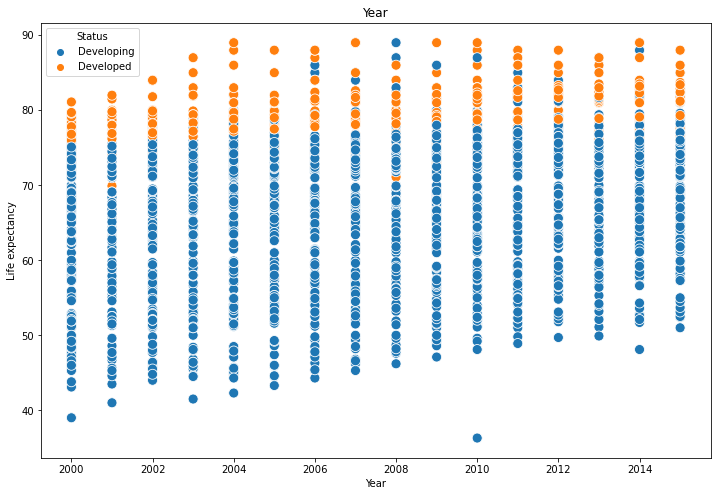

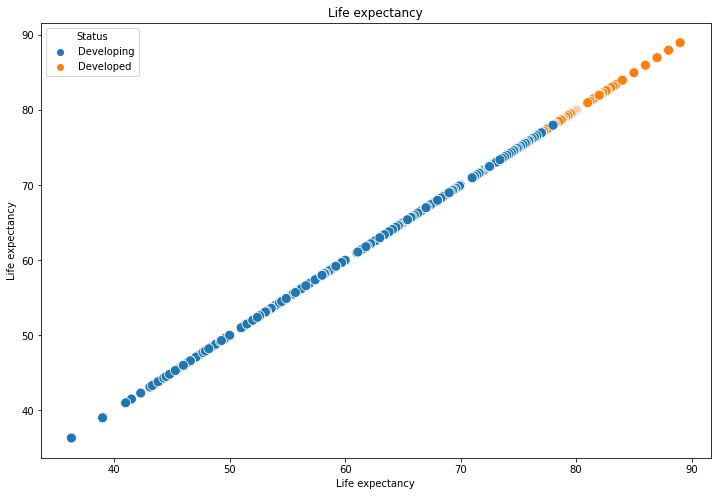

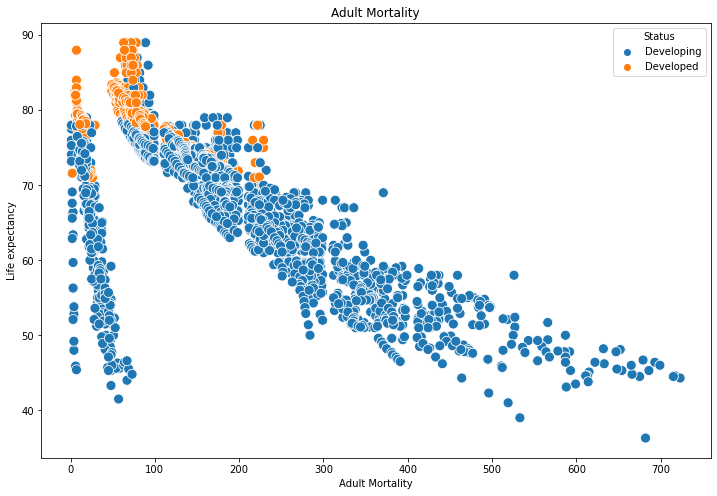

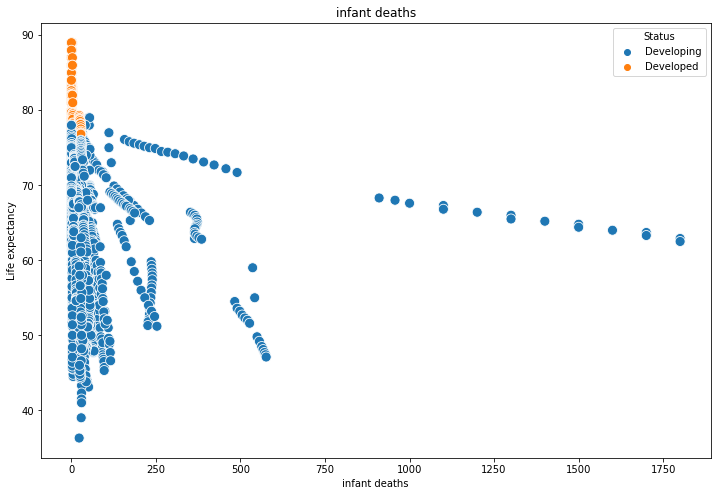

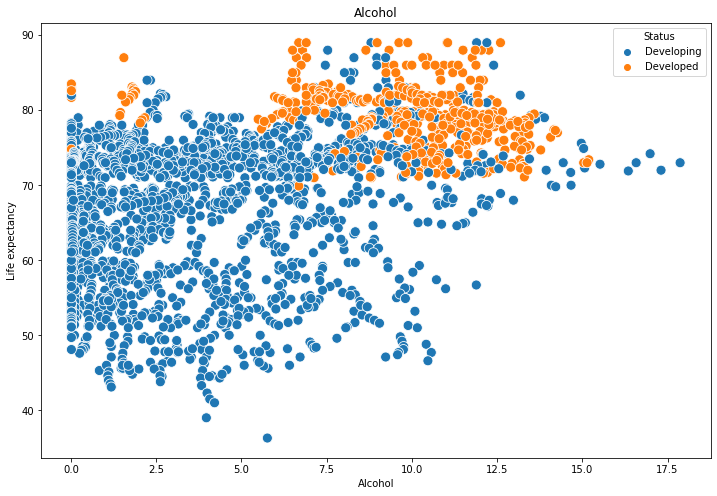

...

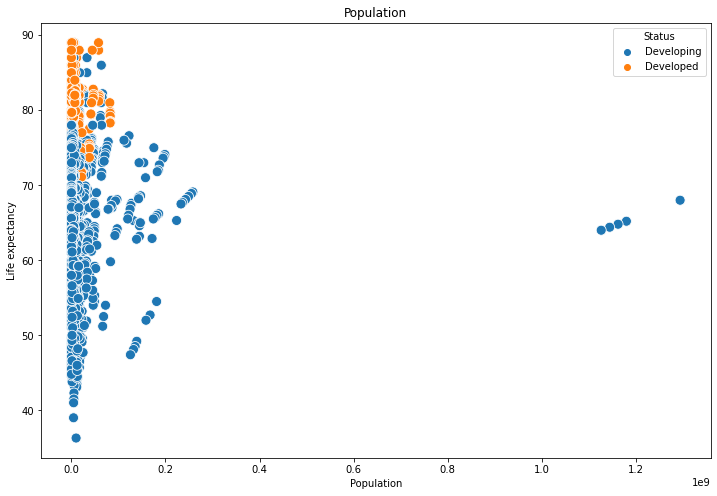

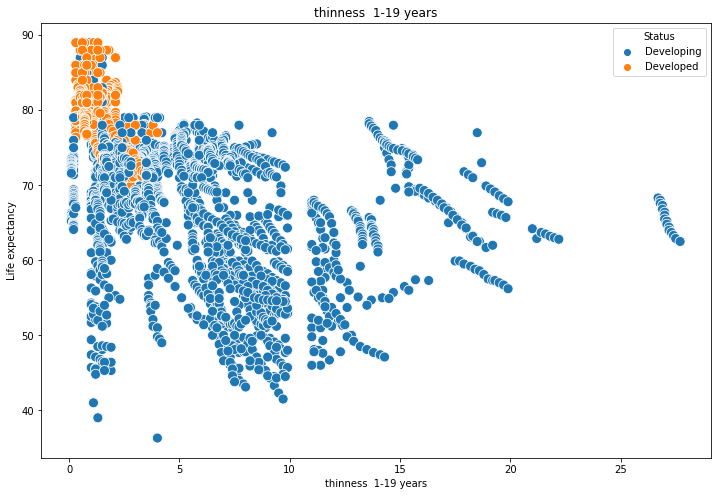

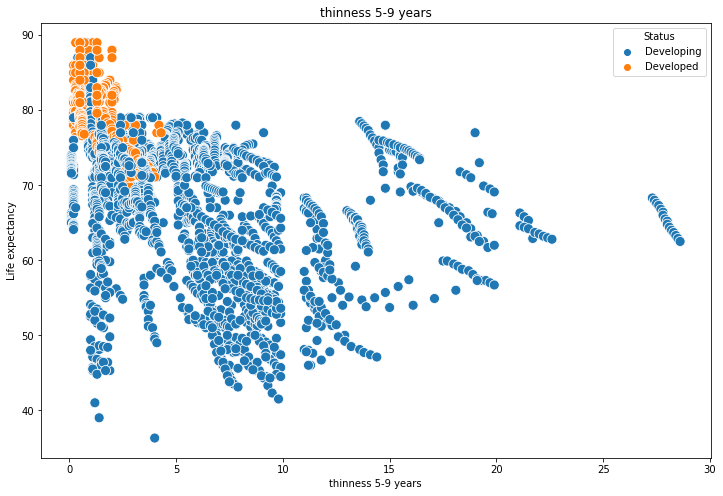

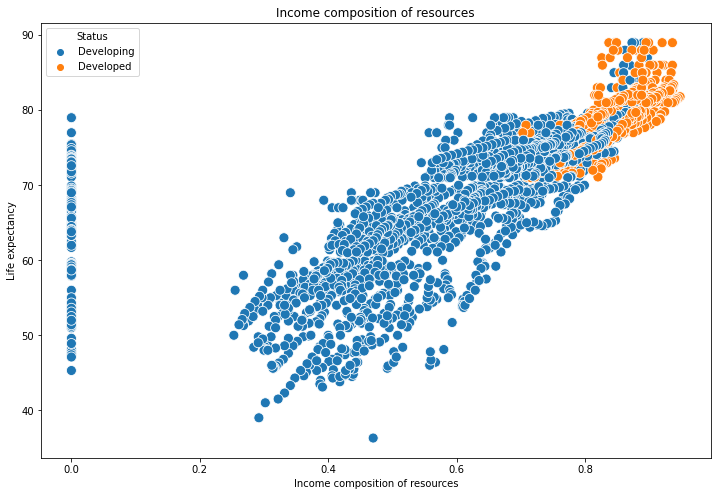

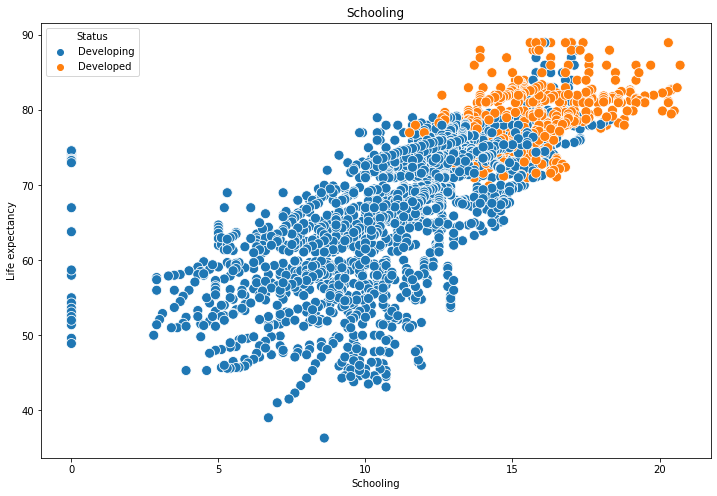

In [130]:
for i in df_num:
    print("\n")
    plt.figure(figsize=(12,8))
    sns.scatterplot(data=df, x=df[i],y=df['Life expectancy'],hue='Status',s=100, color = rand_color()).set(title = i);

<IPython.core.display.Javascript object>

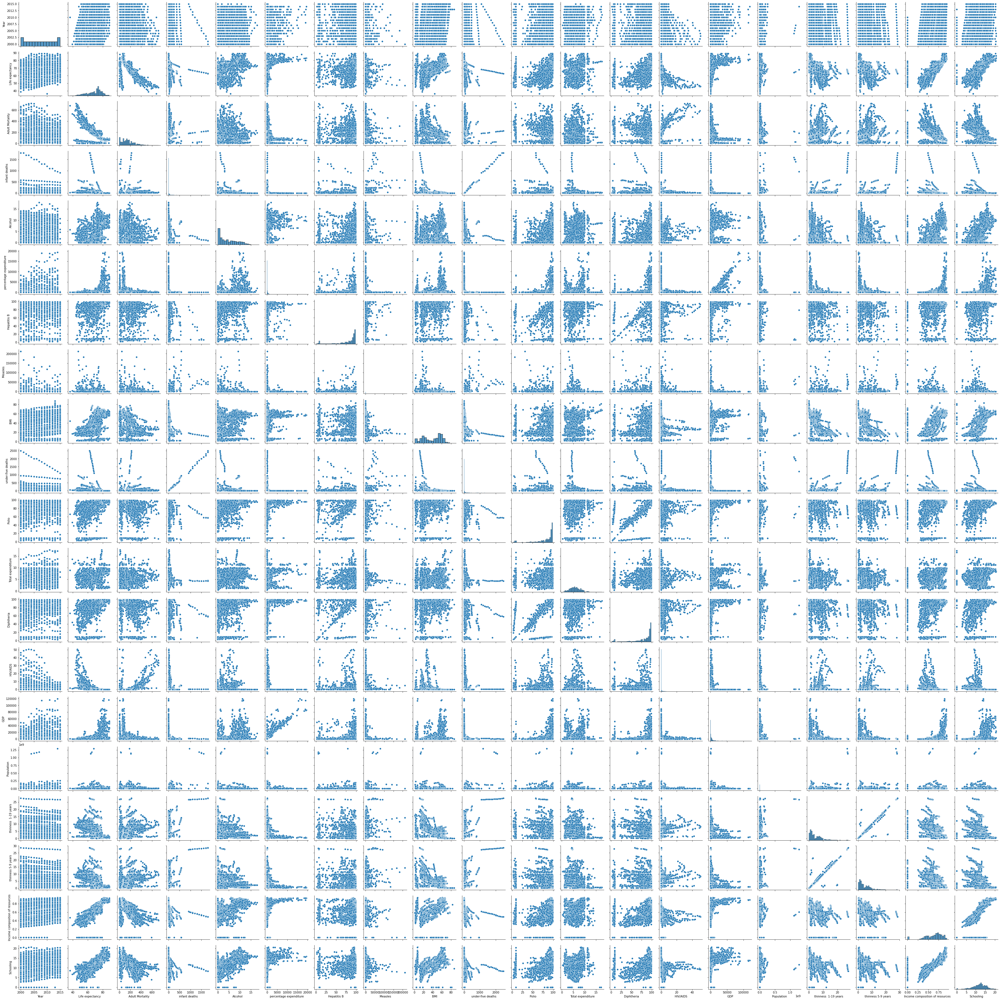

In [132]:
sns.pairplot(df);

# Missing Values

In [39]:
df.isnull().sum()

Country                              0
Year                                 0
Status                               0
Life expectancy                     10
Adult Mortality                     10
infant deaths                        0
Alcohol                            194
percentage expenditure               0
Hepatitis B                        553
Measles                              0
BMI                                 34
under-five deaths                    0
Polio                               19
Total expenditure                  226
Diphtheria                          19
HIV/AIDS                             0
GDP                                448
Population                         652
thinness  1-19 years                34
thinness 5-9 years                  34
Income composition of resources    167
Schooling                          163
dtype: int64

In [40]:
# Total missing values
df.isnull().sum().sum()

2563

In [41]:
(df.isnull().mean()*100).round(2)

Country                             0.00
Year                                0.00
Status                              0.00
Life expectancy                     0.34
Adult Mortality                     0.34
infant deaths                       0.00
Alcohol                             6.60
percentage expenditure              0.00
Hepatitis B                        18.82
Measles                             0.00
BMI                                 1.16
under-five deaths                   0.00
Polio                               0.65
Total expenditure                   7.69
Diphtheria                          0.65
HIV/AIDS                            0.00
GDP                                15.25
Population                         22.19
thinness  1-19 years                1.16
thinness 5-9 years                  1.16
Income composition of resources     5.68
Schooling                           5.55
dtype: float64

In [42]:
df.isnull().sum().sort_values(ascending=False)

Population                         652
Hepatitis B                        553
GDP                                448
Total expenditure                  226
Alcohol                            194
Income composition of resources    167
Schooling                          163
thinness 5-9 years                  34
thinness  1-19 years                34
BMI                                 34
Polio                               19
Diphtheria                          19
Life expectancy                     10
Adult Mortality                     10
HIV/AIDS                             0
Country                              0
Year                                 0
Measles                              0
percentage expenditure               0
infant deaths                        0
Status                               0
under-five deaths                    0
dtype: int64

In [43]:
# Column wise Missing values in relative form
Percent_missing=(df.isnull().sum().sort_values(ascending=False)*100/len(df)).round(2)
Percent_missing

Population                         22.19
Hepatitis B                        18.82
GDP                                15.25
Total expenditure                   7.69
Alcohol                             6.60
Income composition of resources     5.68
Schooling                           5.55
thinness 5-9 years                  1.16
thinness  1-19 years                1.16
BMI                                 1.16
Polio                               0.65
Diphtheria                          0.65
Life expectancy                     0.34
Adult Mortality                     0.34
HIV/AIDS                            0.00
Country                             0.00
Year                                0.00
Measles                             0.00
percentage expenditure              0.00
infant deaths                       0.00
Status                              0.00
under-five deaths                   0.00
dtype: float64

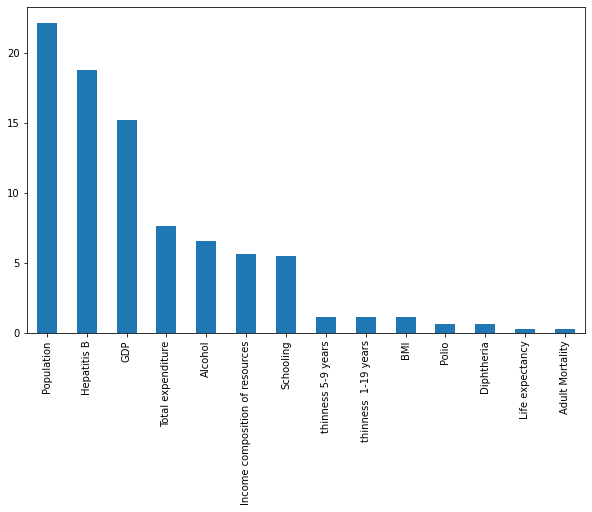

In [44]:
Percent_missing[Percent_missing!=0].plot(kind='bar',figsize=(10,6));

In [45]:
!pip install missingno

In [46]:
import missingno as msno

<IPython.core.display.Javascript object>

<Figure size 72x72 with 0 Axes>

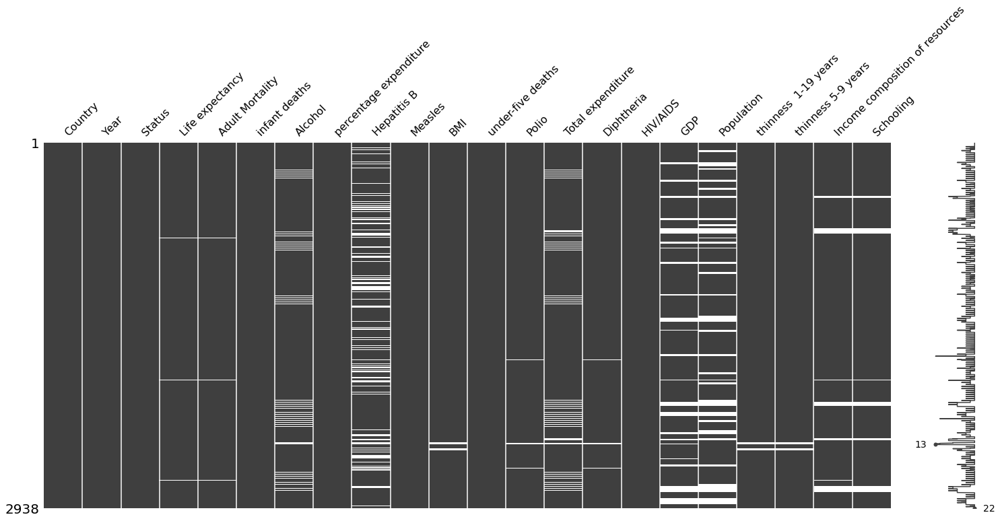

In [47]:
plt.figure(figsize=(1,1))
msno.matrix(df);

<IPython.core.display.Javascript object>

<Figure size 72x72 with 0 Axes>

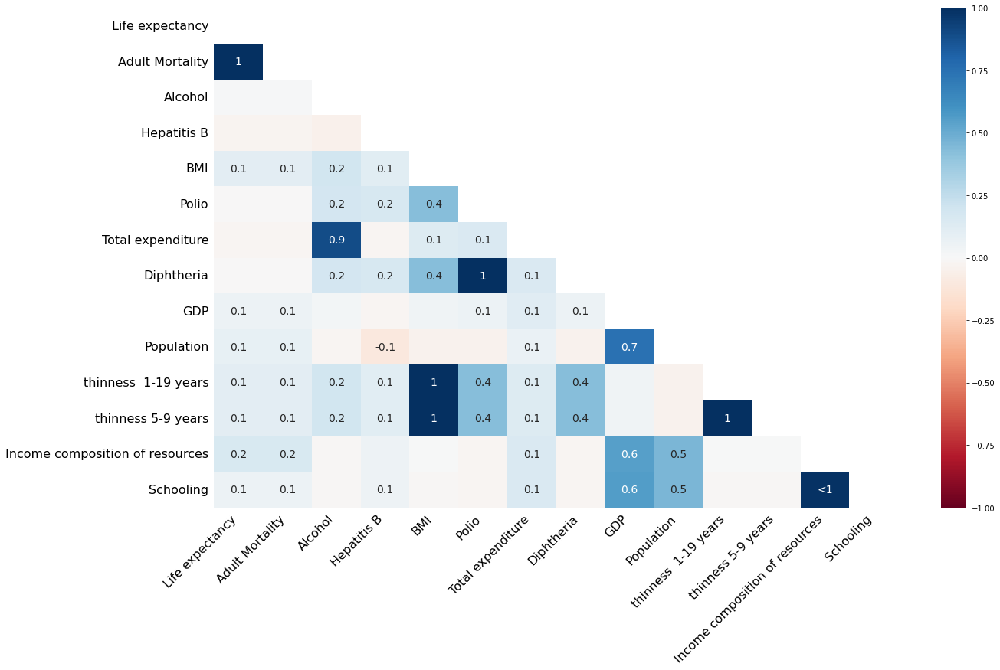

In [48]:
plt.figure(figsize=(1,1))
msno.heatmap(df);

# Duplicated Rows

In [49]:
duplicate_rows=df[df.duplicated()]
print('Number of duplicated rows: ',duplicate_rows.shape[0])

Number of duplicated rows:  0


# Outliers and Anomalies

In [77]:
Q1 = df.quantile(0.25)
Q3 = df.quantile(0.75)
IQR = Q3 - Q1

upper_limit=Q3 + 1.5 * IQR
lower_limit=Q1 - 1.5 * IQR
Outliers = df[((df <=lower_limit ) |(df >=upper_limit ))]
len(Outliers)

2938

In [243]:
for i in df_num:
    Q1 = df[i].quantile(0.25)
    Q3 = df[i].quantile(0.75)
    IQR = Q3 - Q1
    upper_limit=Q3 + 1.5 * IQR
    lower_limit=Q1 - 1.5 * IQR
    Outliers = df[((df[i] <=lower_limit ) |(df[i] >=upper_limit ))]
    print(f'Total number of outliers in "{i}" are:', Outliers.shape[0])

Total number of outliers in "Year" are: 0
Total number of outliers in "Life expectancy" are: 10
Total number of outliers in "Adult Mortality" are: 85
Total number of outliers in "infant deaths" are: 326
Total number of outliers in "Alcohol" are: 0
Total number of outliers in "percentage expenditure" are: 389
Total number of outliers in "Hepatitis B" are: 262
Total number of outliers in "Measles" are: 542
Total number of outliers in "BMI" are: 0
Total number of outliers in "under-five deaths" are: 398
Total number of outliers in "Polio" are: 279
Total number of outliers in "Total expenditure" are: 32
Total number of outliers in "Diphtheria" are: 298
Total number of outliers in "HIV/AIDS" are: 542
Total number of outliers in "GDP" are: 365
Total number of outliers in "Population" are: 294
Total number of outliers in "thinness  1-19 years" are: 89
Total number of outliers in "thinness 5-9 years" are: 96
Total number of outliers in "Income composition of resources" are: 130
Total number of

# Outliers Visualization

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

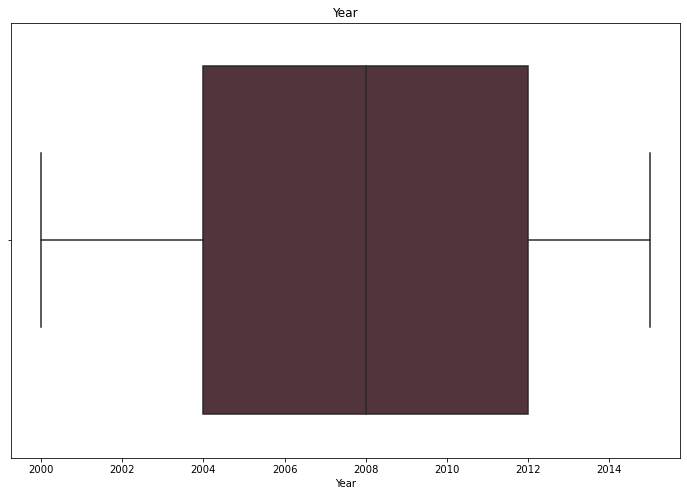

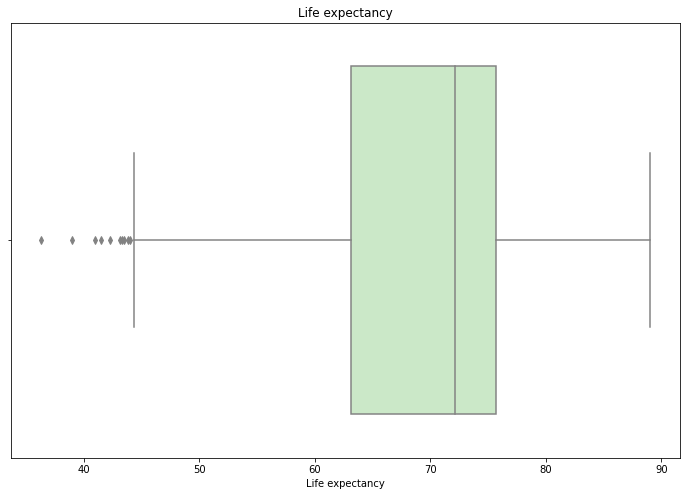

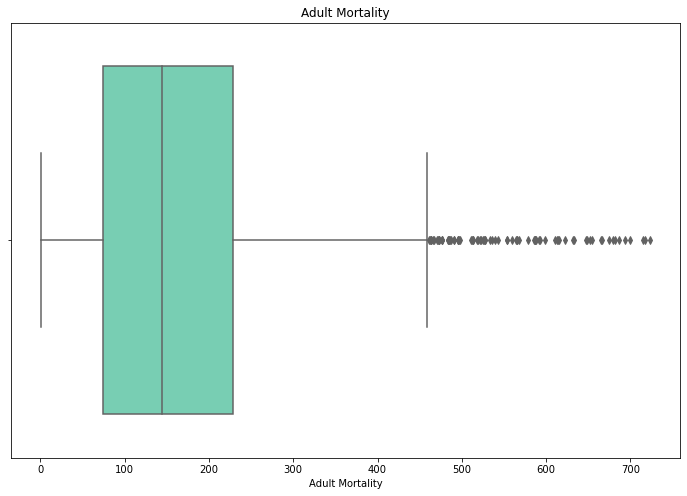

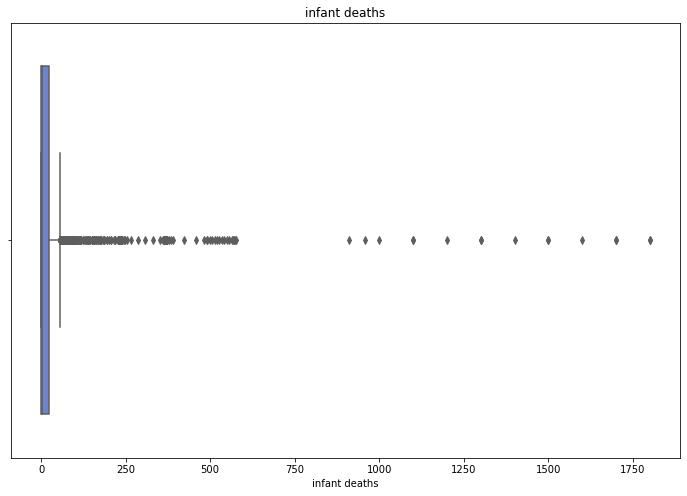

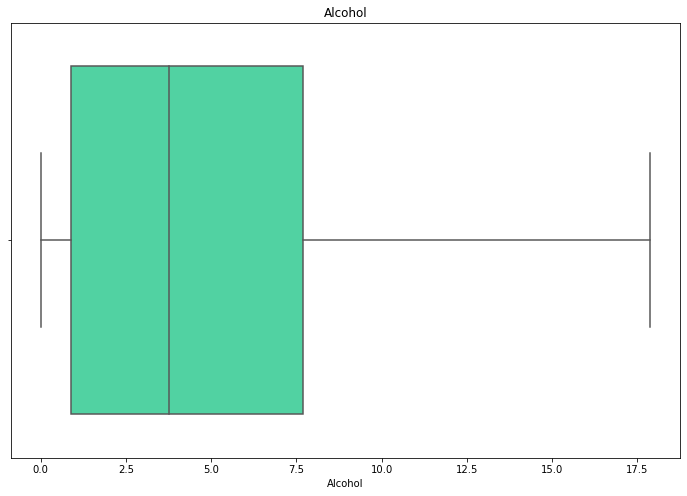

...

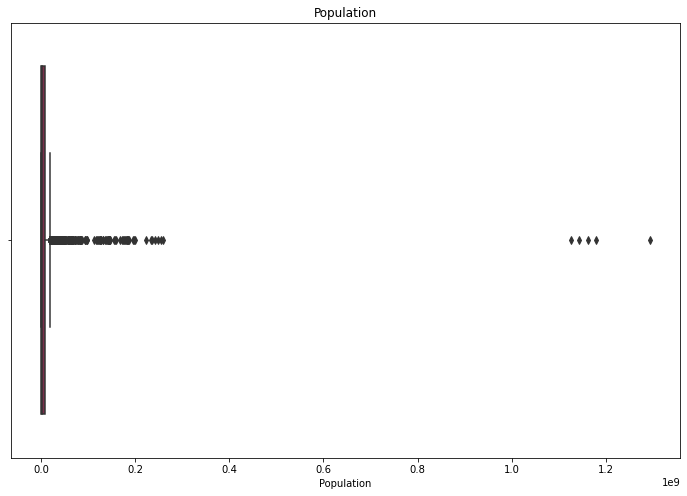

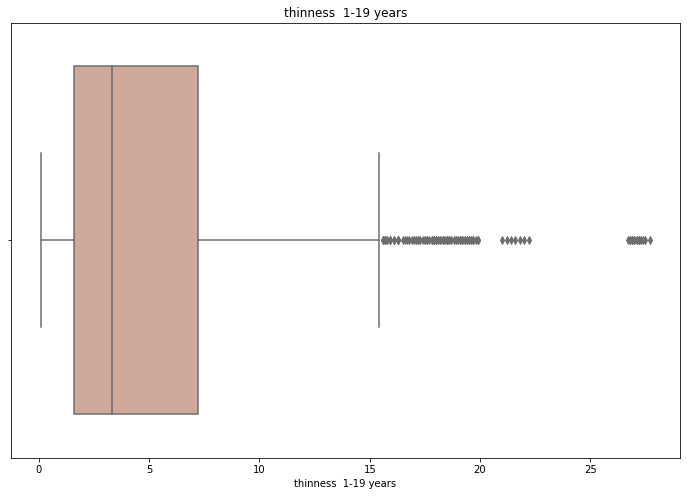

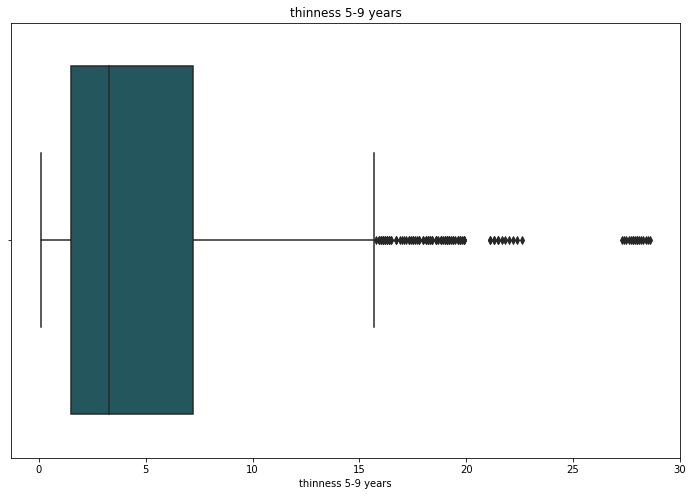

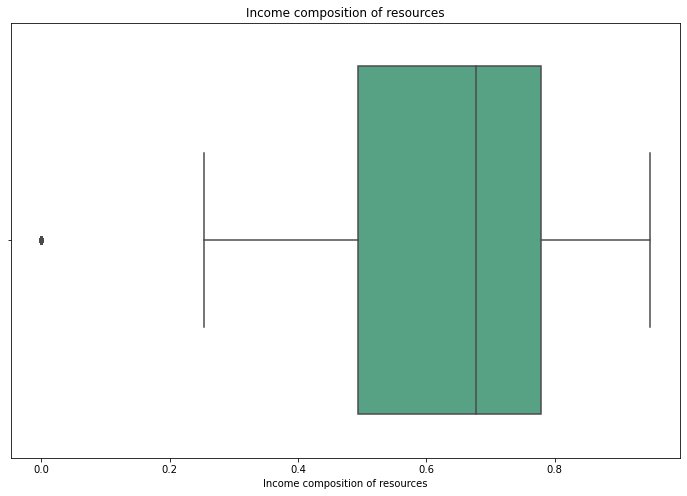

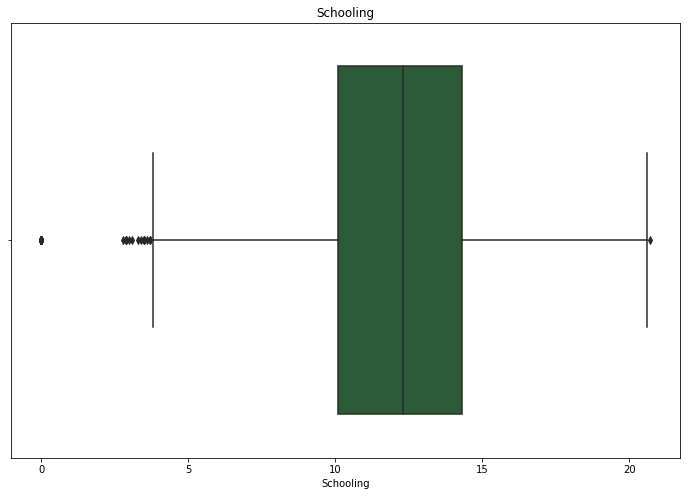

In [240]:
for i in df_num:
    print("\n")
    plt.figure(figsize=(12,8))
    sns.boxplot(df[i], color = rand_color()).set(title = i)